# Visión por Computador - Práctica 1 - Filtrado de Imágenes

#### 12 puntos   |   Fecha de entrega: 03 de Noviembre, 23:59   |   Forma de entrega: a través de la tarea creada en https://pradogrado2425.ugr.es/

### Estudiante: <mark>MIGUEL ÁNGEL FERNÁNDEZ ALONSO</mark>





---



## Normas de entrega

1. Para este trabajo, al igual que para los demás, se debe presentar código, resultados, discusión de los mismos, y presentación y análisis del trabajo realizado, todo integrado en el propio Google Colab Notebook (es decir, no se entrega ninguna memoria separada en `.pdf` ni ningún código `.py`). Se recuerda que código y resultados sin informe explicativo no puntúa.

2. En relación con el punto anterior, solo se acepta la entrega de ficheros `.ipynb` (no resulta válido entregar un fichero `.py`).

3. El diseño de celdas del documento debe ser respetado.

4. Solo se entregará el fichero `.ipynb` (incorporando código, resultados, y explicación del trabajo realizado y los resultados obtenidos) y no se enviarán las imágenes empleadas.

5. El path para la lectura de imágenes, o cualquier otro fichero de entrada, debe ser siempre “/content/drive/My Drive/images/nombre_fichero”

6. El código deberá  presentarse adecudamente comentado y con los resultados obtenidos en cada apartado, junto con la presentación del trabajo realizado y la discusión y análisis de los resultados obtenidos. Es importante reiterar que la entrega de código sin informe explicativo o valoraciones no puntúa. Por otro lado, el código debe ir comentado en comentarios en celdas de código, mientras que el análisis y discusión, tanto del trabajo realizado como de los resultados obtenidos, debe ir en celdas de texto.

Este trabajo de implementación tiene como objetivo principal **familiarizarse con la implementación y uso de filtros de convolución, así como del cálculo de las derivadas de una imagen y sus posibles aplicaciones**.








---



## Funciones de apoyo y conexión con Google Drive

In [2]:
# We start by getting access to the drive
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [3]:
# We import the modules to use
import os,sys
import cv2, numpy as np, math
from matplotlib import pyplot as plt
# change directory
%cd '/content/drive/My Drive'
#  the current directory
%pwd

# This allows to display images  and to save  them in cells
%matplotlib inline
# this definition allows to read files in a specific path
get_image = lambda route: os.path.join('/content/drive/My Drive/images', route)

/content/drive/My Drive


Las funciones que se incluyen a continuación, se proporcionan como ayuda/apoyo para el estudiante. **En caso de que el alumnado prefiera utilizar otras funciones para lectura, normalización y visualización de imágenes, tiene total libertad para hacerlo, pero sí debe justificar y explicar razonadamente el motivo de dicho cambio y describir las modificaciones realizadas.**

Recuérdese que todas las imágenes a emplear durante las prácticas de todo el curso se pueden encontrar en el enlace de Google Drive indicado en PRADO: https://pradogrado2425.ugr.es/mod/url/view.php?id=91457 En concreto, https://drive.google.com/drive/folders/1UtvY8q6w1Cz9a9T9zxIqSweoRLgNwoW-

In [4]:
'''
This function receives a string with the filename of the image to read,
and a flag indicating if we want to read it in color/RGB (flagColor=1) or gray level (flagColor=0)

Example of use:
im1=readIm(get_image('apple.jpg'),0)

'''
def readIm(filename, flagColor=1):
  # cv2 reads BGR format
  im=cv2.imread(filename)
  # change to  RGB and return the image
  if(flagColor):
    return cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
  # change from BGR to grayscale instead if flag is 0
  return cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)

In [5]:
'''
This function receives an array of arbitrary real numbers (that could include even negative values),
and returns an 'image' in the range [0,1].
flag_GLOBAL allows the user to normalize the whole image (including all channels) or to normalize
each channel/band independently.
'''
def rangeDisplay01(im, flag_GLOBAL= True):
  im = im.astype(float)
  if flag_GLOBAL:
    im = (im - im.min())/(im.max() - im.min())
  else:
    # bands normalization
    for band in range(im.shape[2]):
      im[:, :, band] = (im[:, :, band] - im[:, :, band].min())/(im[:, :, band].max() - im[:, :, band].min())
      # Note: remember that, for plt.imshow with RGB data, the valid range is [0..1] for floats and [0..255] for integers.
  return im

In [6]:
'''
This function displays a single image, including a title, using a magnification factor.

Example of use:
im1=readIm(get_image('apple.jpg'),0)
displayIm(im1,'Manzana',0.5)

'''
def displayIm(im, title='Result',factor= 2):
  # First normalize range
  max=np.max(im)
  min=np.min(im)
  if min<0 or max>255:
    im=rangeDisplay01(im,flag_GLOBAL=True)
  if len(im.shape) == 3:
    # im has three-channels
    plt.imshow(im, cmap='jet')
  else:
    # im has a single-channel
    plt.imshow(im, cmap='gray')
  figure_size = plt.gcf().get_size_inches()
  plt.gcf().set_size_inches(factor * figure_size)
  plt.title(title)
  plt.xticks([]), plt.yticks([])
  plt.show()

In [7]:
'''
This function displays multiple images (including a title and using a magnification factor)
of equal size. The input to the function is a list of images.

Example of use:
im1=readIm(get_image('apple.jpg'),1)
images = [im1,im1,im1]

displayMI_ES(images, title='Manzanas',factor=1)

'''
def displayMI_ES(vim, title='Result',factor=2):
  # We set the maximun number of images to concatenate by columns
  maxcolumns=3
  # number of images to display
  numberim=len(vim)
  # The simplest case, one row: the maximum number of columns is larger than the images to stack
  # This is, by default, we put together the images column-wise
  if len(vim) < maxcolumns:
    out=vim[0]
    for item in range(1,len(vim)):
      #displayIm(out,str(item),1)
      out=np.hstack((out,vim[item]))

  # Else, if maxcolumns is smaller or equal than the number of images to stack
  else:
    # We check if all rows and columns are going to be 'busy', or if otherwise we need an extra-row
    if np.mod(len(vim),maxcolumns)== 0:
      maxrows=numberim//maxcolumns
    else:
      maxrows=numberim//maxcolumns+1

    # we build up the first block-row
    out=vim[0]
    for item in range(1,maxcolumns):
      out=np.hstack((out,vim[item]))
    # We build up the rest of block-rows
    for block in range(1,maxrows):
      #print(block)
      row=vim[block*maxcolumns]
      for item in range(1,maxcolumns):
        # We still have images to stack
        if block*maxcolumns+item < numberim:
          row=np.hstack((row,vim[block*maxcolumns+item]))
        # We do not have more images, and we have to fill with black
        else:
          row=np.hstack((row,np.zeros(vim[0].shape,dtype=vim[0].dtype)))
          #print(row.dtype)
          # if we don't include ',dtype=vim[0].dtype', np.zeros will include float
          # numbers in the matrix. This will make that the whole matrix will be
          # considered as floats, and values larger than 1 will be clipped to 1,
          # displaying an almost totally white image
      # add the new block-row
      out=np.vstack((out,row))
  return displayIm(out,title,factor)

# **Ejercicio 1: discretización de máscaras y filtrado Gaussiano** (6 puntos)

En este ejercicio aprenderemos a discretizar máscaras de convolución y a aplicarlas sobre imágenes empleando funciones de OpenCV. También buscamos hacerlo de un modo eficiente, y es por ello que, en toda la práctica, se exige el uso de convoluciones 1D (separables).





## A) (1.5 puntos)

En este apartado se deben realizar las siguientes tareas:

1. Calcular las máscaras discretas 1D de la Gaussiana, así como su primera y segunda derivadas (normalizadas), considerando que la entrada a dicha función de creación de máscaras 1D puede ser tanto un posible sigma como un posible tamaño de máscara.
2. Emplear los siguientes valores de sigma ($\{1, 1.5, 2.5, 6\}$) y los siguientes valores de tamaño de máscara ($\{7, 11, 15\}$), y mostrar el perfil (es decir, la silueta de las máscaras como funciones 1D) para verificar que las máscaras creadas son correctas.
3. Describir/explicar/analizar si las formas de dichos kernels tienen sentido y se corresponden con lo que esperaríamos ver.

La construcción de la máscara Gaussiana proviene de la discretización de la función Gaussiana, cuya expresión (con media $\mu = 0$) para $x \in \mathbb{R}$ viene dada por:

<font color='60a2dd'>$$G(x) = \frac{1}{\sigma \sqrt{2 \pi}} e^{-\frac{x^2}{2 \sigma^2}}$$  


Podemos notar que la función depende de la desviación típica $\sigma$. Se tiene que, a mayor valor de $\sigma$ menor valor en $G(0)$ (en $G(0)$ se encuentra el máximo de la función). Cabe mencionar también que la función está normalizada, de forma que sus valores en el eje $Y$ siempre se encuentran en el intervalo $[0,1]$. De la misma forma, los valores de la primera y la segunda derivada en el eje $Y$ se sitúan en el intervalo $[-1,1]$.

Además, una propiedad muy importante que cabe mencionar de la Gaussiana es que es separable (lo cual hace que la aplicación de máscaras Gaussianas a imágenes sea muy eficiente computacionalmente), es decir, la Gaussiana 2D puede expresarse como producto de dos funciones (que, en este caso, ambas funciones son la Gaussiana 1D), una en función de $x$ y otra en función de $y$.

Recordemos también que en una distribución normal, el intervalo $[-3\sigma, 3\sigma]$ abarca el $99.73\%$ de los valores de la función. Por ello, como para la máscara discreta Gaussiana debe tomarse nodos equiespaciados, el tamaño de nuestra máscara vendrá dado por:

<font color='60a2dd'>$$T = 2*[3\sigma] + 1$$


Si se proporciona, por ejemplo, $T = 5$, podemos rellenar los valores de la máscara haciendo $[G(-2), G(-1), G(0), G(1), G(2)]$ y sustituyendo en la función Gaussiana un sigma $\sigma = \frac{T-1}{6} = 0.67$.


Se deduce fácilmente que a mayor $\sigma$, mayor tamaño de máscara $T$.

Por simpleza computacional, ignoramos la constante $c = \frac{1}{\sigma \sqrt{2 \pi}}$ de la función $G(x)$. Obviando dicha constante,
la primera derivada de la Gaussiana sería:


<font color='60a2dd'>$$G'(x) = \frac{d G(x)}{dx} = e^{-\frac{x^2}{2\sigma^2}}(-\frac{x}{\sigma^2}) = G(x)(-\frac{x}{\sigma^2})$$

De igual forma, la segunda derivada de la Gaussiana vendría dada por:

<font color='60a2dd'>$$G''(x) = \frac{d^2 G(x)}{dx^2} = G'(x)(-\frac{x}{\sigma^2}) + G(x)(-\frac{1}{\sigma^2})$$


Finalmente, cabe destacar que a la hora de generar las máscaras discretas de la primera y la segunda derivada de la Gaussiana, hay que multiplicar por $\sigma$ y $\sigma^2$, respectivamente, con el fin de escalar/normalizar dichas máscaras. Si las máscaras no estuviesen normalizadas, se podrían realizar cambios en el brillo o contraste de la imagen a la hora de realizar la operación de convolución, lo cual no es deseado a la hora de aplicar un filtro Gaussiano (usado para suavizar o difuminar una imagen sin alterar significativamente sus propiedades generales). Por ello, nos aseguramos de normalizar las máscaras.


In [8]:
#Esta función implementa la función gaussiana
#Se ignora la constante que multiplica a la exponencial
def GaussFunc(x,sigma):
    return np.exp(-x**2 / (2* sigma**2))


#Esta función implementa la primera derivdada de la función gaussiana
def GaussDeriv1Func(x,sigma):
    return GaussFunc(x, sigma) * (-x / sigma**2)

#Esta función implementa la segunda derivdad de la función gaussiana
def GaussDeriv2Func(x,sigma):
    return GaussDeriv1Func(x, sigma) * (-x / sigma**2) + GaussFunc(x, sigma) * (-1 / sigma**2)

#Función para devolver la máscara 'f' de tamaño 'sizeMask'
def Mask(f, sizeMask):
  k = (sizeMask - 1) // 2
  return [f(i) for i in range(-k, k + 1)]

#Función para calcular el tamaño de la máscara a partir del valor de sigma
def DeductSizeMaskFromSigma(sigma):
  return int((2 * np.floor(3*sigma)) + 1)

#Función para calcular el valor de sigma a partir del tamaño de la máscara
#Suponemos floor(3 * sigma) = 3 * sigma
def DeductSigmaFromSizeMask(sizeMask):
  return (sizeMask - 1) / 6.0

#Función para calcular la máscara gaussiana de tamaño 'sizeMask' y orden 'order'
def calculateGaussMask(sigma, sizeMask, order):
  if(order == 0):
    unnormalizedMask = np.array(Mask(lambda x: GaussFunc(x, sigma), sizeMask), np.float64)
    #Dividimos cada coeficiente por la suma de todos ellos para que la suma de 1
    suma = sum(unnormalizedMask)
    normalizedMask = unnormalizedMask/suma
    return normalizedMask
  #Máscara Primera Derivada Gaussiana (Filtro Paso Alto)
  elif(order == 1):
  #Escalamos mutliplicando por 'sigma'
    mask = np.array(Mask(lambda x: sigma * GaussDeriv1Func(x, sigma), sizeMask), np.float64)
    return mask
  #Máscara Segunda Derivada Gaussiana (Filtro Paso Alto)
  elif(order == 2):
    #Escalamos multiplicando por 'sigma'**2
    mask = np.array(Mask(lambda x: sigma**2 * GaussDeriv2Func(x, sigma), sizeMask), np.float64)
    return mask


#Esta función calcula y devuelve la máscara gaussiana de tamaño 'sizeMask'y orden 'order'
#Sigma debe ser mayor o igual que 0, 'order' debe ser 0, 1 o 2.
#No puede darse que 'sigma' y 'sizeMask' sean 0 a la vez (uno de ellos debe ser distinto de 0)
def gaussianMask1D(sigma=0, sizeMask=0, order=0):
  #Comprobamos los requisitos descritos
  assert sigma >= 0
  assert 0 <= order <= 2
  assert sigma !=0 or sizeMask != 0

  if(sizeMask == 0):
    #Deducir 'sizeMask' a partir de 'sigma'
    sizeMask = DeductSizeMaskFromSigma(sigma)
  elif(sigma == 0):
    #Deducir 'sigma' a partir de 'sizeMask'
    sigma = DeductSigmaFromSizeMask(sizeMask)

  #Máscara Gaussiana de orden 'order'
  mask = calculateGaussMask(sigma, sizeMask, order)

  return mask


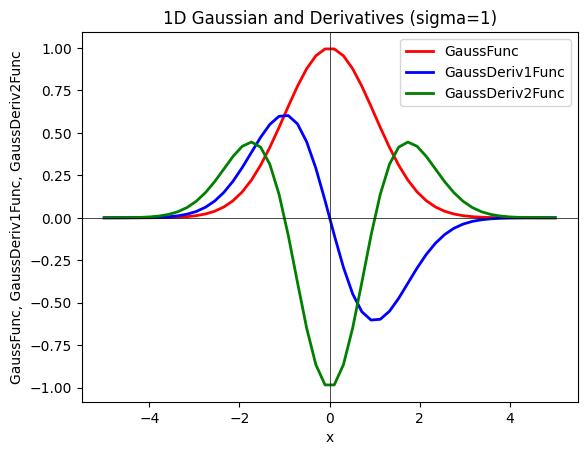

In [9]:
# Con la siguiente figura verificamos que las funciones Gaussianas implementadas son correctas
plt.figure()
xvalues = np.linspace(-5, 5)
yvalues1 = GaussFunc(xvalues,1)
yvalues2 = GaussDeriv1Func(xvalues,1)
yvalues3 = GaussDeriv2Func(xvalues,1)
plt.plot(xvalues, yvalues1, lw=2, color='red',
label='GaussFunc')
plt.plot(xvalues, yvalues2, lw=2, color='blue',
label='GaussDeriv1Func')
plt.plot(xvalues, yvalues3, lw=2, color='green',
label='GaussDeriv2Func')
plt.title('1D Gaussian and Derivatives (sigma=1)')
plt.xlabel('x')
plt.ylabel('GaussFunc, GaussDeriv1Func, GaussDeriv2Func')
plt.axhline(0, lw=0.5, color='black')
plt.axvline(0, lw=0.5, color='black')
plt.legend()

Como ya se comentó anteriormente la función está normalizada, de forma que sus valores en el eje $Y$ siempre se encuentran en el intervalo $[0,1]$ y los de su primera y segunda derivada se sitúan en el intervalo $[-1,1]$ en el eje $Y$ (si se hubiese dejado el factor de normalización $c = \frac{1}{\sigma \sqrt{2 \pi}}$ de la función $G(x)$, la forma sería igual y solo cambiaría la escala). De igual forma, también se comento que en $G(0)$ se encuentra el máximo de la función. Todo esto se observa claramente en la gráfica anterior.

También sabemos que, geométricamente, el valor de la derivada de una función evaluada en un punto es la pendiente de la recta tangente de la función en dicho punto. Esta idea nos dice en pocas palabras que, si la función crece, entonces la pendiente de su recta tangente crece también. Así, el uso de la derivada de una función puede ayudar a determinar si una función es creciente, decreciente o constante en un intervalo dado:


- Si la derivada es positiva, la función es creciente.

- Si la derivada es negativa, la función es decreciente.

- Si la derivada es cero, la función tiene un punto crítico y puede ser un máximo o un mínimo.

Teniendo en cuenta esto, si nos fijamos, por ejemplo, en la función gaussiana y en su primera derivada de la gráfica, vemos que se cumple la idea geométrica comentada anteriormente.


Todo lo anterior nos da indicaciones de de que la función gaussiana, su primera derivada y segunda derivada se han implementado correctamente.

Además, en vista a las gráficas de la gaussiana y su primera derivada, se deduce claramente que el filtro gaussiano es un filtro paso bajo (elimina altas frecuencias y deja pasar las bajas frecuencias, por lo que, como ya comentamos anteriormente, suavizará la imagen), a diferencia del filtro de la primera derivada de la gaussiana, que son filtros paso alto (elimina bajas frecuencias y deja pasar las altas frecuencias, por lo que realza los bordes de la imagen).

FIJAMOS PRIMERO EL TAMAÑO DE LA MÁSCARA


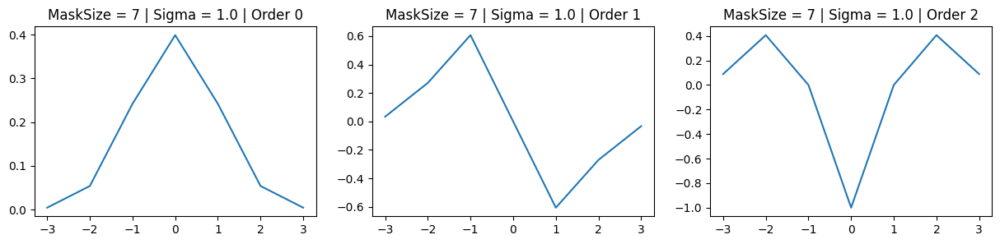

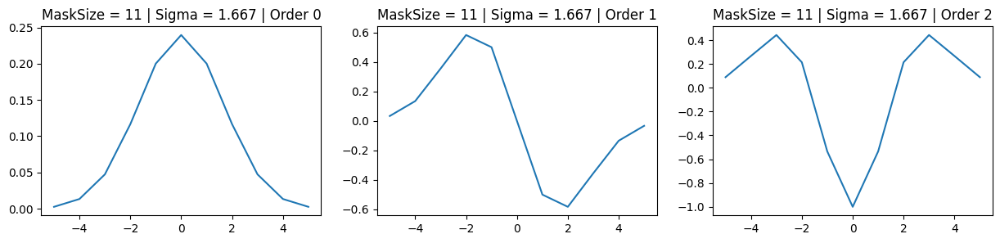

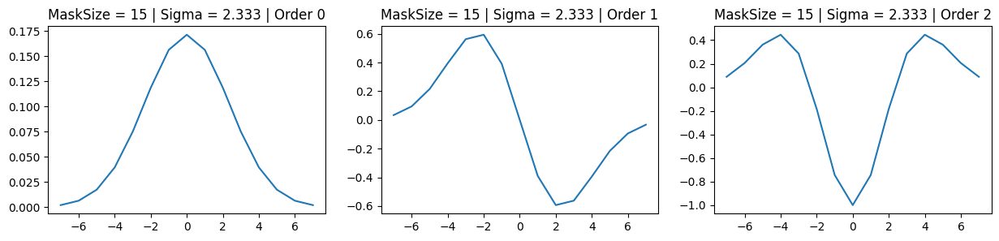

FIJAMOS AHORA EL SIGMA


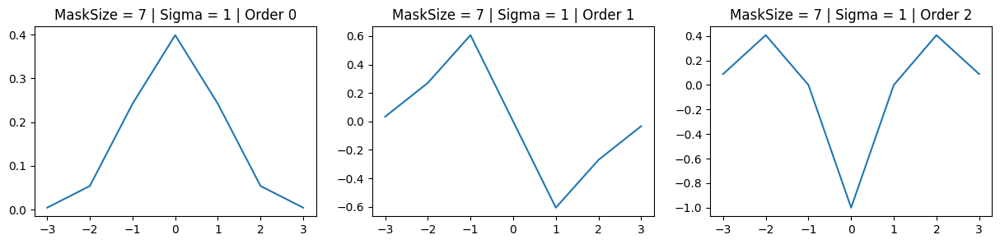

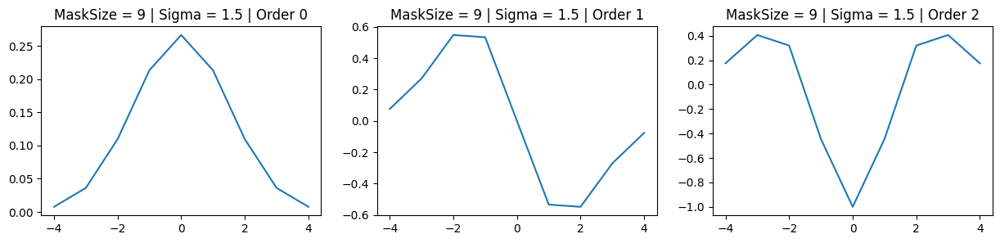

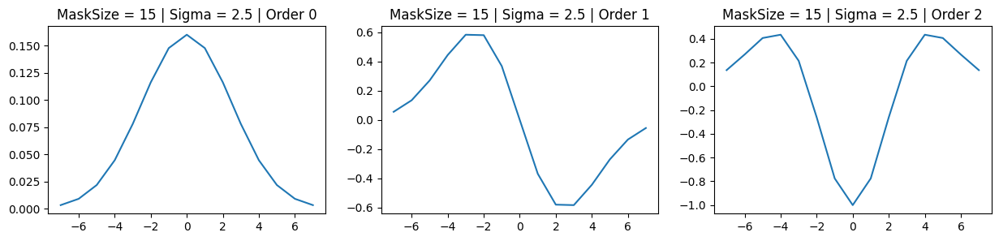

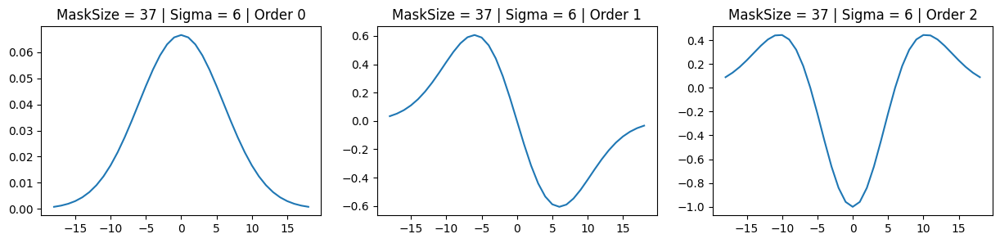

In [10]:
sigma_values = [1, 1.5, 2.5, 6]
size_masks = [7, 11, 15]

plt.rcParams["figure.figsize"] = (15,3) # Para ajustar tamaño del ancho y alto (ejes)
print('FIJAMOS PRIMERO EL TAMAÑO DE LA MÁSCARA')
for sizeMask in size_masks:
  # Gráficamos las máscaras para cada 'order' (0, 1 o 2)
  for order in range(3):
    sigma = DeductSigmaFromSizeMask(sizeMask) # Deducir 'sigma' a partir de 'sizeMask'
    xvalues = np.linspace(-sizeMask // 2 + 1, sizeMask // 2, sizeMask) # Valores Eje X
    yvalues = gaussianMask1D(sigma, sizeMask, order) # Valores Eje Y
    plt.subplot(1, 3, order + 1) # Subgráficas
    plt.plot(xvalues, yvalues)
    plt.title(f'MaskSize = {sizeMask} | Sigma = {round(sigma,3)} | Order {order}' ) # Título
  plt.show()

print('FIJAMOS AHORA EL SIGMA')
for sigma in sigma_values:
  # Gráficamos las máscaras para cada 'order' (0, 1 o 2)
  for order in range(3):
    sizeMask = DeductSizeMaskFromSigma(sigma) # Deducir 'sizeMask' a partir de 'sigma'
    xvalues = np.linspace(-sizeMask // 2 + 1, sizeMask // 2, sizeMask) # Valores Eje X
    yvalues = gaussianMask1D(sigma, sizeMask, order) # Valores Eje Y
    plt.subplot(1, 3, order + 1) # Subgráficas
    plt.plot(xvalues, yvalues)
    plt.title(f'MaskSize = {sizeMask} | Sigma = {round(sigma,3)} | Order {order}' ) # Título
  plt.show()

Observamos que a mayor tamaño de máscara (o a mayor sigma, ya que uno depende linealmente del otro de forma positiva) la aproximación dada por las máscaras se asemejan más a la función gaussiana continua y sus dos primeras derivadas.

Si comparamos las máscaras de (MaskSize = 37 | Sigma = 6) con respecto a la gráfica anterior donde se encuentran la función gaussiana continua, su primera y su segunda derivada, se observa que la aproximación es muy buena.

### <font color='60a2dd'> Comparativa con `cv2.getDerivKernels()`

MÁSCARAS OBTENIDAS CON GETDERIVKERNELS()
FIJAMOS PRIMERO EL TAMAÑO DE LA MÁSCARA


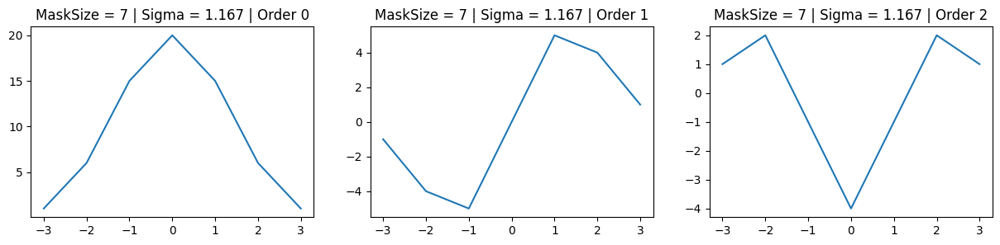

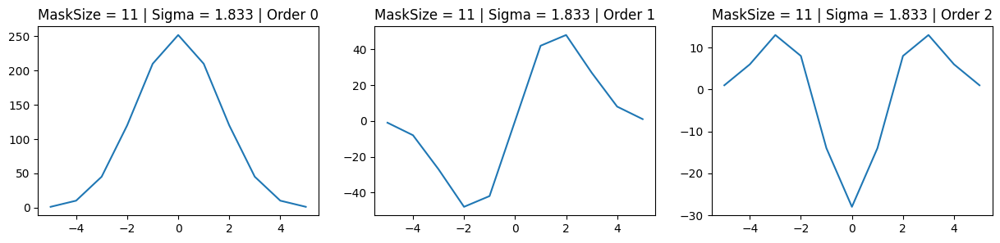

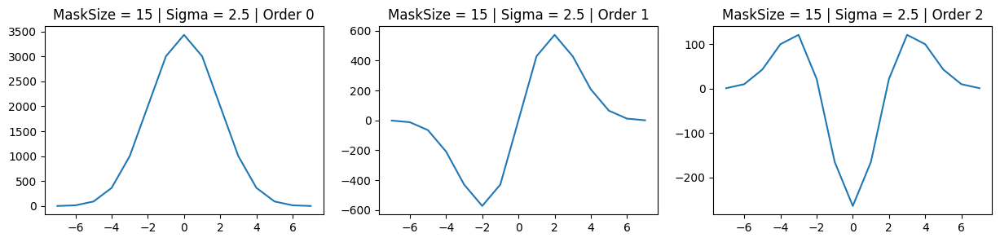

FIJAMOS AHORA EL SIGMA


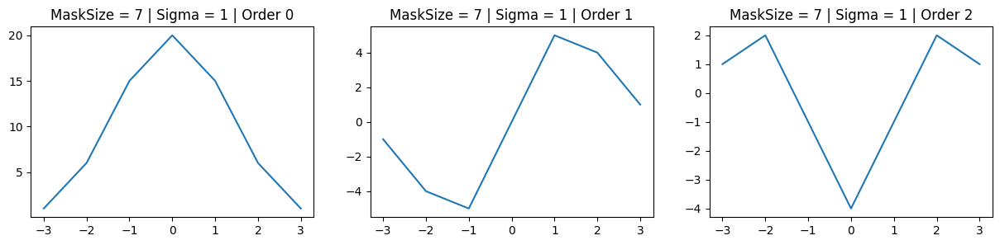

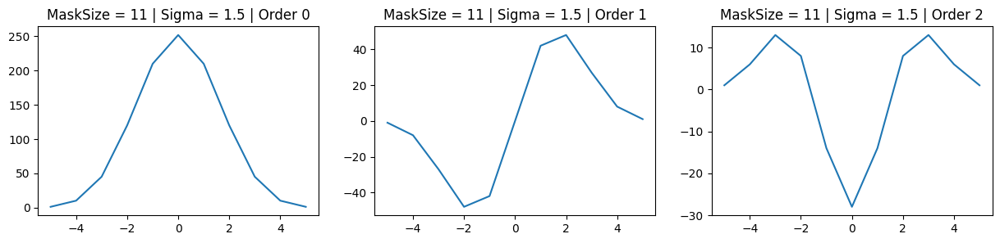

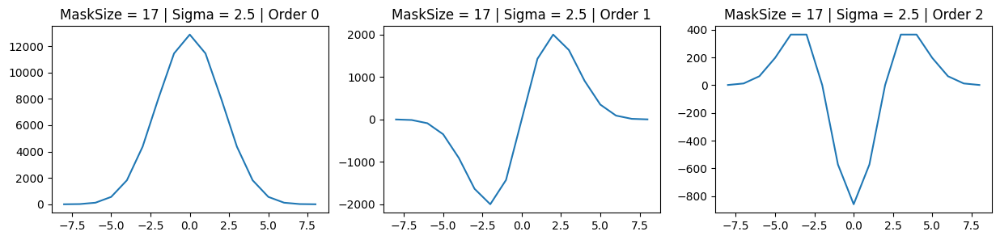

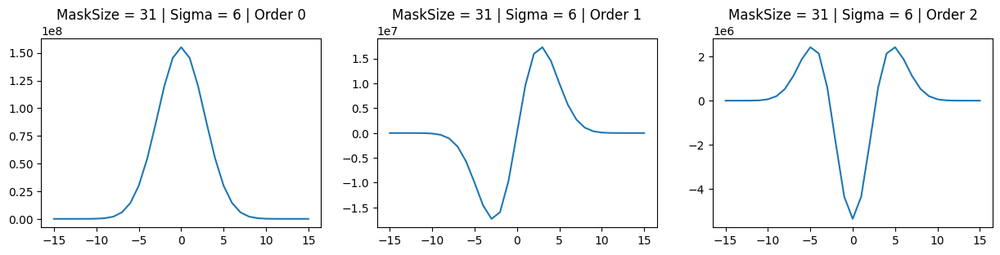

In [13]:
def DeductSizeMaskFromSigma(sigma):
  """
  This function estimates the appropriate size of the Gaussian kernel
  based on the provided sigma value.

  A common rule of thumb is to use a kernel size of 6 times sigma + 1
  to ensure that the Gaussian function is sufficiently sampled.
  We also ensure that the kernel size is odd and capped at a maximum of 31
  to meet the requirements of cv2.getDerivKernels.
  """
  sizeMask = int(6 * sigma + 1)
  # Ensure sizeMask is odd
  sizeMask = sizeMask + 1 if sizeMask % 2 == 0 else sizeMask
  # Cap sizeMask at 31
  sizeMask = min(sizeMask, 31)
  return sizeMask

def DeductSigmaFromSizeMask(sizeMask):
    #Aproximación
    return sizeMask/6

sigma_values = [1, 1.5, 2.5, 6]
size_masks = [7, 11, 15]

print('MÁSCARAS OBTENIDAS CON GETDERIVKERNELS()')

plt.rcParams["figure.figsize"] = (15,3) # Para ajustar tamaño del ancho y alto (ejes)
print('FIJAMOS PRIMERO EL TAMAÑO DE LA MÁSCARA')
for sizeMask in size_masks:
  # Gráficamos las máscaras para cada 'order' (0, 1 o 2)
  for order in range(3):
    sigma = DeductSigmaFromSizeMask(sizeMask) # Deducir 'sigma' a partir de 'sizeMask'
    xvalues = np.linspace(-sizeMask // 2 + 1, sizeMask // 2, sizeMask) # Valores Eje X
    yvalues = cv2.getDerivKernels(order, 1, sizeMask)[0] # Valores Eje Y
    plt.subplot(1, 3, order + 1) # Subgráficas
    plt.plot(xvalues, yvalues)
    plt.title(f'MaskSize = {sizeMask} | Sigma = {round(sigma,3)} | Order {order}' ) # Título
  plt.show()

print('FIJAMOS AHORA EL SIGMA')
for sigma in sigma_values:
  # Gráficamos las máscaras para cada 'order' (0, 1 o 2)
  for order in range(3):
    # We call the modified DeductSizeMaskFromSigma function here to ensure the kernel size is within limits.
    sizeMask = DeductSizeMaskFromSigma(sigma) # Deducir 'sizeMask' a partir de 'sigma'
    xvalues = np.linspace(-sizeMask // 2 + 1, sizeMask // 2, sizeMask) # Valores Eje X
    yvalues = cv2.getDerivKernels(order, 1, sizeMask)[0] # Valores Eje Y
    plt.subplot(1, 3, order + 1) # Subgráficas
    plt.plot(xvalues, yvalues)
    plt.title(f'MaskSize = {sizeMask} | Sigma = {round(sigma,3)} | Order {order}' ) # Título
  plt.show()

La función `getDerivKernels()` nos proporciona filtros de Scharr o Sobel. Comparando las máscaras obtenidas por nuestra función `gaussianMask1D()` con las obtenidas por la función `getDerivKernels()`, podemos observar a primera vista que:

- Las máscaras dadas por la función `getDerivKernels()` no están normalizadas, ya que los valores del eje $Y$ se disparan, llegando incluso al valor 3500.
- Las gráficas de las máscaras dadas por ambas funciones "casi" coinciden en algunos casos (para cierto MaskSize, cierto Sigma y cierto Order). Sin embargo, hay algunos casos en los que difieren completamente, como puede ser el caso (MaskSize = 31 | Sigma = 6 | Order 1) fijado el sigma. Esto es así porque, aunque ambas máscaras sirvan para detectar bordes, los valores concretos son muy diferentes entre una y otra.

### <font color='60a2dd'>Conclusiones de la comparativa
A pesar de que las máscaras dadas por ambas funciones sean diferentes, ambas aproximan bien a la función Gaussiana continua.

Si nos preguntáramos cuál aproximación es mejor, gráficamente se observa que las máscaras obtenidas por nuestra función `gaussianMask1D()` aproximan mejor. Se pueden comparar, por ejemplo, las máscaras de `gaussianMask1D()` con las de `getDerivKernels()` en el caso (MaskSize = 31 | Sigma = 6), observándose claramente que las máscaras dadas por nuestra función `gaussianMask1D()` se aproximan mejor a la función continua. Analíticamente esto tiene sentido ya que cada nodo toma exactamente el valor de la función Gaussiana $G$ (para hacer un análisis más exhaustivo podría analizarse la diferencia de áreas entre la aproximación de cada máscara y la función continua, sabiendo que antes habría que normalizar las máscaras dadas por  `getDerivKernels()`).

 También podríamos preguntarnos cuál es el error cometido entre la aproximación dada por `gaussianMask1D()` y la aproximación dada por `getDerivKernels()`. En un primer momento, podríamos pensar en utilizar  el error cudrático medio como métrica de error, sin embargo, no sería la más adecuada para este caso. En mi opinión, una buena métrica de error sería estimar la diferencia de áreas entre las aproximaciones (recordando que antes de ello habría que normalizar las máscaras dadas por `getDerivKernels()`).

Cabe mencionar que, a pesar de ser peores aproximaciones las máscaras dadas por `getDerivKernels()` como ya comentamos anteriormente, al aumentar el tamaño de la máscara, la aproximación mejora (es decir, se asemeja más a la función continua), al igual que ocurre con nuestra función `gaussianMask1D()`.

## B) (1.5 puntos)

En este apartado se debe leer una imagen en escala de grises (`'zebra.jpg'`) y esta debe ser filtrada mostrando el resultado de la convolución con una Gaussiana, con la primera derivada de la Gaussiana (tanto en $X$ como en $Y$), y con la segunda derivada de la Gaussiana (tanto en $X$ como en $Y$). Para ello, hay que:
1. emplear los siguientes sigmas ($\{0.75,1,2,4,8, 16\}$),
2. usar la función de OpenCV `sepFilter2D()` con las máscaras calculadas a partir de las funciones desarrolladas en el apartado anterior,
3. mostrar todas las imágenes dentro del mismo canvas, tal y como se muestra más abajo,
4. analizar los resultados obtenidos y discutir si se corresponden con lo se esperaría obtener en base a nuestro conocimiento de la teoría.




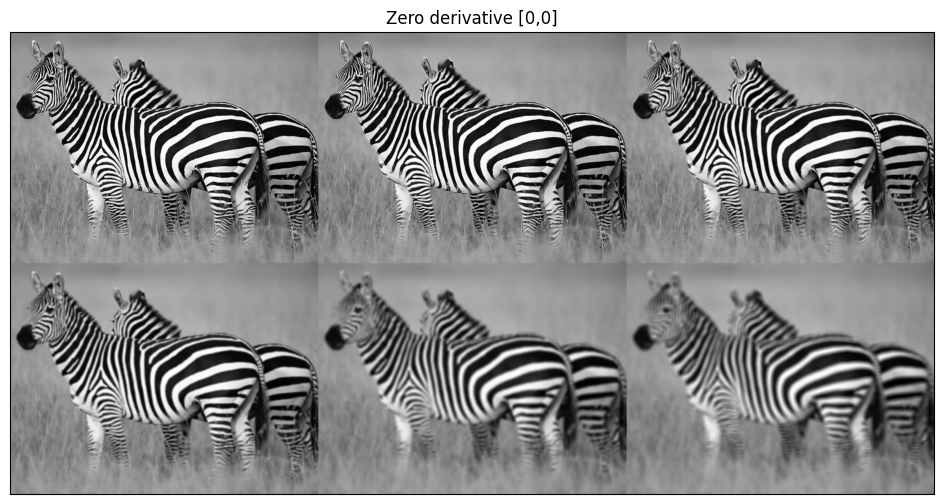

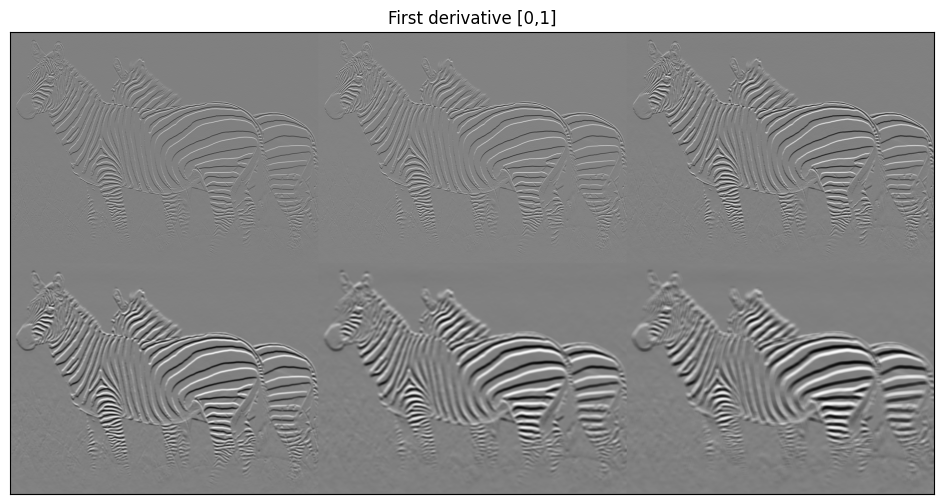

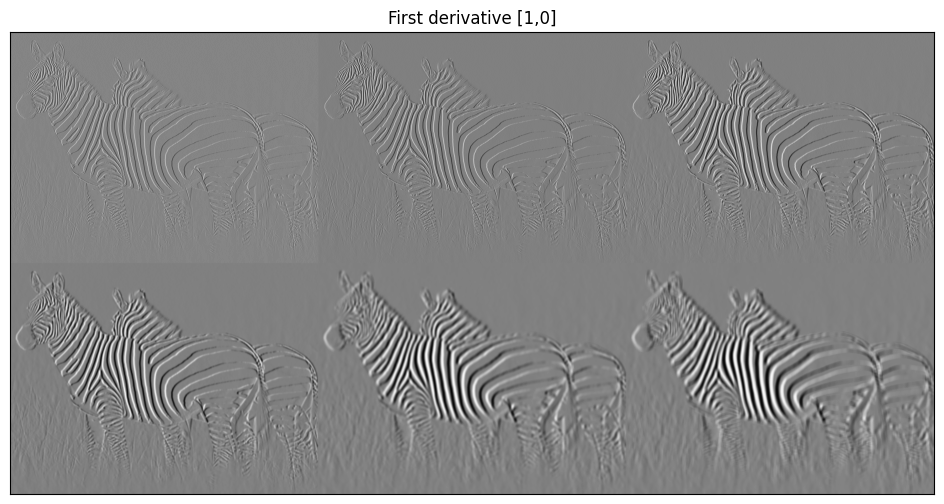

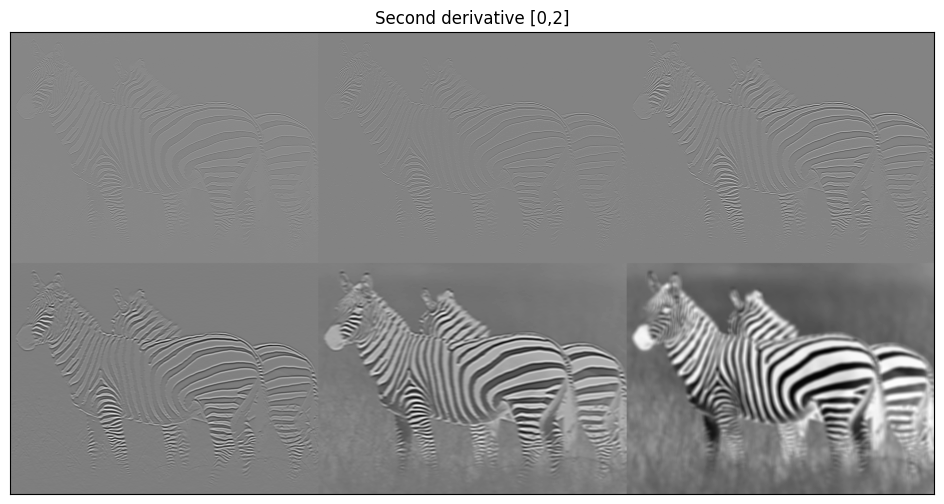

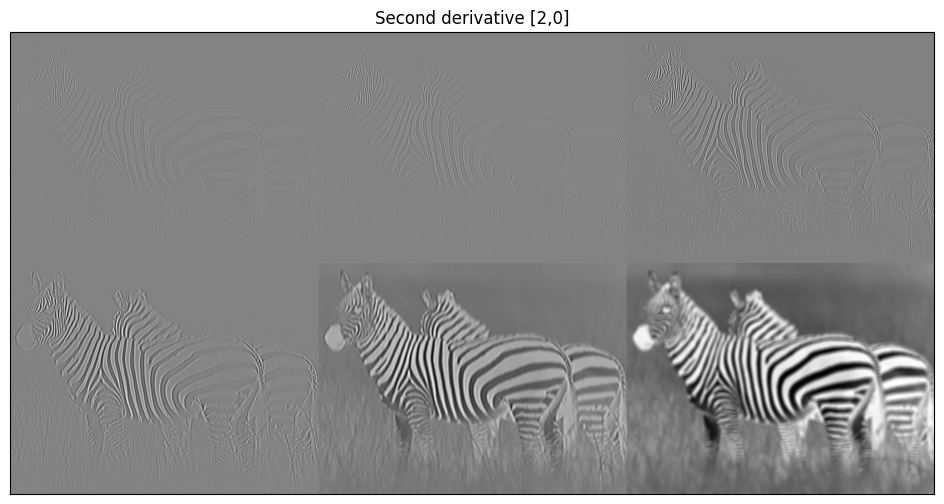

In [14]:
'''
    Esta función devuelve el resultado de convolucionar una imagen con:
        - Una Gaussiana (orders == [0,0])
                - Una Gaussiana (orders == [0,0])
                - La Primera Derivada de la Gaussiana
                  tanto en X (orders == [1,0]) como en Y (orders == [0,1])
                - La Segunda Derivada de la Gaussiana
                  tanto en X (orders == [2,0]) como en Y (orders == [0,2])
    Requisito: 'sigma' debe ser mayor o igual que 0.
'''
def my2DConv(im, sigma, orders):
    ddepth = cv2.CV_64F
    maskG = gaussianMask1D(sigma, order=0)
    maskDG = gaussianMask1D(sigma, order=1)
    mask2DG = gaussianMask1D(sigma, order=2)
    if orders==[0,0]: # Suavizado Gaussiano
      return cv2.sepFilter2D(im, ddepth, maskG, maskG)
    elif orders==[1,0]: # Convolución con la Primera Derivada Gaussiana en X
      return cv2.sepFilter2D(im, ddepth, maskDG, maskG)
    elif orders==[0,1]: # Convolución con la Primera Derivada Gaussiana en Y
      return cv2.sepFilter2D(im, ddepth, maskG, maskDG)
    elif orders==[2,0]: # Convolución con la Segunda Derivada Gaussiana en X
      return cv2.sepFilter2D(im, ddepth, mask2DG, maskG)
    elif orders==[0,2]: # Convolución con la Segunda Derivada Gaussiana en Y
      return cv2.sepFilter2D(im, ddepth, maskG, mask2DG)
    else:
      print('error in order of derivative')


sigmas = [0.75,1,2,4,8,16]

#Lectura de imagen
im=cv2.imread(get_image('zebra.jpg'),0)

# Suavizado Gaussiano
vim0=[]
orders=[0,0]
for sigma in sigmas:
  vim0.append(rangeDisplay01(my2DConv(im,sigma,orders),True))

# Primera Derivada Gaussiana en Y
vim1=[]
orders=[0,1]
for sigma in sigmas:
  vim1.append(rangeDisplay01(my2DConv(im,sigma,orders),True))

# Primera Derivada Gaussiana en X
vim2=[]
orders=[1,0]
for sigma in sigmas:
  vim2.append(rangeDisplay01(my2DConv(im,sigma,orders),True))

# Segunda Derivada Gaussiana en Y
vim3=[]
orders=[0,2]
for sigma in sigmas:
  vim3.append(rangeDisplay01(my2DConv(im,sigma,orders),True))

# Segunda Derivada Gaussiana en X
vim4=[]
orders=[2,0]
for sigma in sigmas:
  vim4.append(rangeDisplay01(my2DConv(im,sigma,orders),True))

# Visualización de imágenes
displayMI_ES(vim0,'Zero derivative [0,0]',2)
displayMI_ES(vim1,'First derivative [0,1]',2)
displayMI_ES(vim2,'First derivative [1,0]',2)
displayMI_ES(vim3,'Second derivative [0,2]',2)
displayMI_ES(vim4,'Second derivative [2,0]',2)




- Con respecto a la imagen `Zero derivative [0,0]`, se observa que, al convolucionar una imagen con un filtro gaussiano, el resultado es la imagen suavizada/emborronada. Vemos que, como era de esperar, a mayor valor de $\sigma$ mayor emborronamiento se produce en la imagen, ya que se eliminan más altas frecuencias de la imagen (recordemos que el filtro gaussiano es un filtro paso bajo).

- Con respecto a la imagen `First derivative [0,1]`, se observa que, al convolucionar una imagen con un filtro en el eje Y de la primera derivada gaussiana, lo que se está haciendo es detectar los cambios bruscos en la intensidad de la imagen en dicho eje, es decir, se están detectando bordes horizontales.

- Con respecto a la imagen `First derivative [1,0]`, se observa que, al convolucionar una imagen con un filtro en el eje X de la primera derivada gaussiana, lo que se está haciendo ahora es detectar los cambios bruscos en la intensidad de la imagen en dicho eje, es decir, se están detectando bordes verticales.

- Con respecto a la imagen `Second derivative [0,2]`, donde se convoluciona una imagen con un filtro en el eje Y de la segunda derivada gaussiana, y la imagen `Second derivative [2,0]`, donde se convoluciona una imagen con un filtro en el eje X de la segunda derivada gaussiana, lo que se está haciendo es detectar los cambios en la tasa de cambio de la intensidad de la imagen (en el eje Y y en el eje X, respectivamente), detectando así las regiones de "pico" o "valle" de la imagen en las que la intensidad cambia de manera más abrupta o suave, respectivamente. Por tanto, al fin y al cabo también estamos detectando bordes como se hacía en `First derivative [0,1]` y en `First derivative [1,0]`, pero se hace a un nivel más alto (pse pueden detectar detalles más pequeños en la imagen). La primera derivada se utiliza comúnmente para la detección de bordes, mientras que la segunda derivada se utiliza para la detección de características más pequeñas y detalles finos en una imagen.

### <font color='60a2dd'> Comparativa con `cv2.GaussianBlur()` y `cv2.Sobel()`

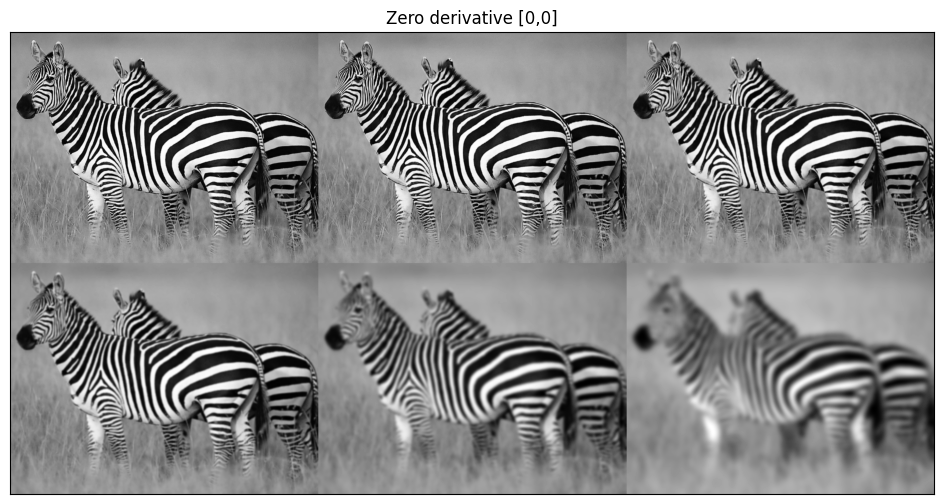

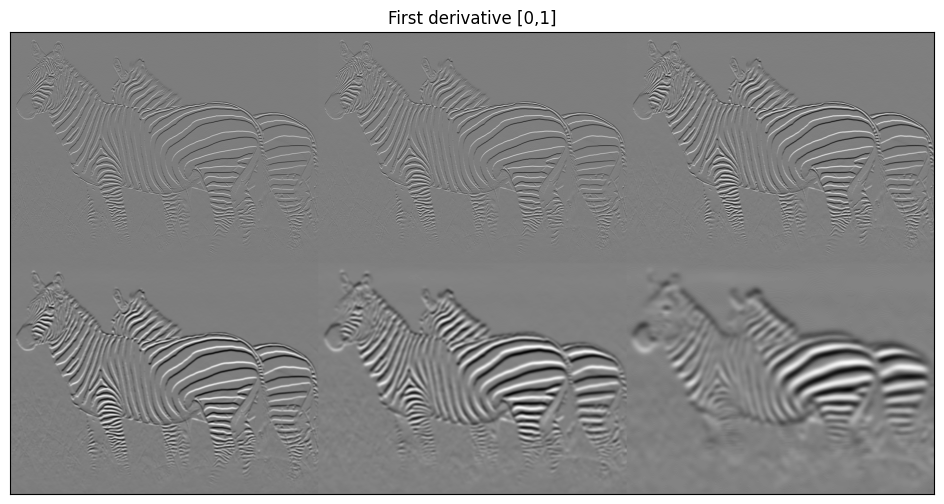

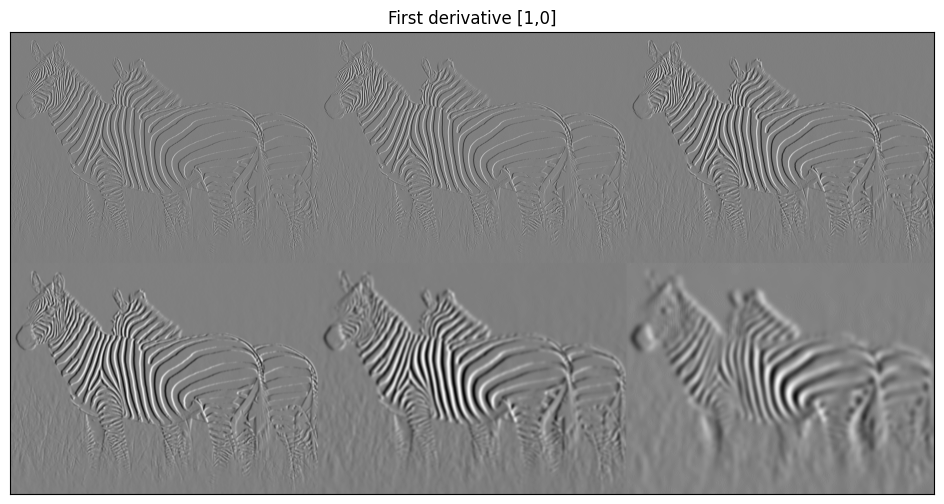

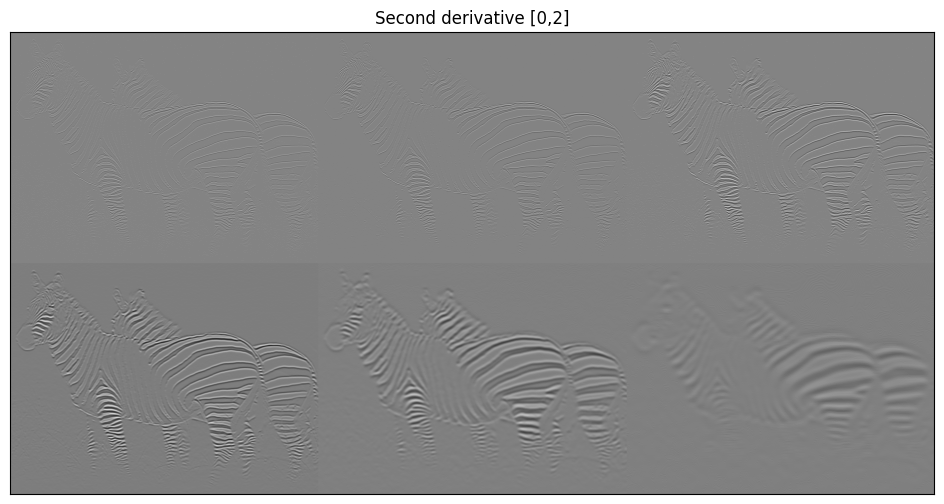

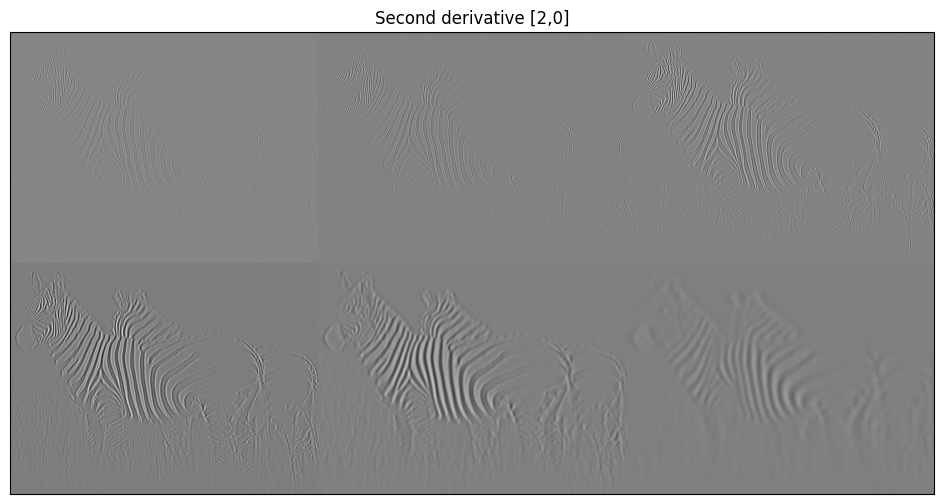

In [15]:
# Lectura de imagen
im = cv2.imread(get_image('zebra.jpg'), 0)

# Suavizado Gaussiano con cv2.GaussianBlur()
vim0=[]
for sigma in sigmas:
  vim0.append(rangeDisplay01(cv2.GaussianBlur(im, (0,0), sigmaX=sigma),True))

# Primera Derivada Gaussiana en Y
vim1=[]
for sigma in sigmas:
  # Aplicar un filtro Gaussiano para suavizar la imagen (no es obligatorio)
  blurIm = cv2.GaussianBlur(im, (0,0), sigmaX=sigma)
  # Deducir el tamaño de la máscara a partir del sigma
  ksize = DeductSizeMaskFromSigma(sigma)
  # Aplica la derivada en el eje Y mediante
  dyIm = cv2.Sobel(blurIm, cv2.CV_64F, 0, 1, ksize)
  vim1.append(rangeDisplay01(dyIm,True))

# Primera Derivada Gaussiana en X
vim2=[]
for sigma in sigmas:
  # Aplicar un filtro Gaussiano para suavizar la imagen (no es obligatorio)
  blurIm = cv2.GaussianBlur(im, (0,0), sigmaX=sigma)
  # Deducir el tamaño de la máscara a partir del sigma
  ksize = DeductSizeMaskFromSigma(sigma)
  # Aplica la derivada en el eje X mediante
  dxIm = cv2.Sobel(blurIm, cv2.CV_64F, 1, 0, ksize)
  vim2.append(rangeDisplay01(dxIm,True))

# Segunda Derivada Gaussiana en Y
vim3=[]
for sigma in sigmas:
  # Aplicar un filtro Gaussiano para suavizar la imagen (no es obligatorio)
  blurIm = cv2.GaussianBlur(im, (0,0), sigmaX=sigma)
  # Deducir el tamaño de la máscara a partir del sigma
  ksize = DeductSizeMaskFromSigma(sigma)
  # Aplica la derivada en el eje Y mediante
  dyyIm = cv2.Sobel(blurIm, cv2.CV_64F, 0, 2, ksize)
  vim3.append(rangeDisplay01(dyyIm,True))

# Segunda Derivada Gaussiana en X
vim4=[]
for sigma in sigmas:
  # Aplicar un filtro Gaussiano para suavizar la imagen (no es obligatorio)
  blurIm = cv2.GaussianBlur(im, (0,0), sigmaX=sigma)
  # Deducir el tamaño de la máscara a partir del sigma
  ksize = DeductSizeMaskFromSigma(sigma)
  # Aplica la derivada en el eje X mediante
  dxxIm = cv2.Sobel(blurIm, cv2.CV_64F, 2, 0, ksize)
  vim4.append(rangeDisplay01(dxxIm,True))

# Visualización de imágenes
displayMI_ES(vim0,'Zero derivative [0,0]',2)
displayMI_ES(vim1,'First derivative [0,1]',2)
displayMI_ES(vim2,'First derivative [1,0]',2)
displayMI_ES(vim3,'Second derivative [0,2]',2)
displayMI_ES(vim4,'Second derivative [2,0]',2)


La función `GaussianBlur()` aplica un filtro Gaussiano a una imagen dada, lo que tiene el efecto de reducir el ruido y eliminar detalles finos.

Vimos en teoría que los filtros de Sobel también se usan para detectar bordes en una imagen. Los filtros de Sobel no son más que la multiplicación de un filtro 1D Gaussiano con el vector que representa la derivada de una imagen en una determinada dirección (eje $X$ o eje $Y$). Para aplicar dichos filtros, disponemos de la función de OpenCV llamada `Sobel()`.

Una observación directa de las imágenes anteriores nos dice que se está realizando todo correctamente (suavizado y detección de bordes).


Si hacemos una comparativa visual de las imágenes obtenidas con nuestras función `my2DConv` y las obtenidas con las funciones `GaussianBlur()` y `Sobel()`, vemos que ambas cumplen su función correctamente. En las imágenes `Zero Derivative [0,0]`, `First Derivative [0,1]` y `First Derivative [1,0]` vemos que casi son similares los resultados obtenidos por ambos caminos. Donde más diferencias podemos apreciar es en `Second Derivate [0,2]` y en `Second Derivate [2,0]`, observándose que con la función `Sobel()` realiza una mejor detección de los bordes en la dirección dada, ya que nuestra función `my2DConv()` detecta principalmente los bordes en la dirección dada pero también detecta otros que van en otras direcciones.

### <font color='60a2dd'> Conclusiones de la comparativa

La primera derivada de la Gaussiana (aplicada tanto en el eje X como en el eje Y), así como segunda derivada de la Gaussiana, sirven, como ya hemos comentado antes, para detectar bordes. Sin embargo, la primera derivada  a ser sensible al ruido, lo que suele requerir un filtrado Gaussiano previo de la imagen para suavizarla y así obtener mejores resultados.

Por otro lado, el filtro de Sobel se centra específicamente en calcular la derivada de primer orden en la dirección dada y es menos sensible al ruido. Es una opción más simple y directa cuando se busca detectar bordes.

En términos de rendimiento y eficiencia computacional, el filtro de Sobel es probablemente más rápido, ya que no requiere el suavizado previo de la imagen mediante un filtro Gaussiano. Sin embargo, ambos caminos producen resultados similares, destacando una mejor detección de bordes en `Second Derivate [0,2]` y en `Second Derivate [2,0]` de la función `Sobel()` en la dirección dada al compararla con nuestra función `my2DConv()`. En pocas palabras, podríamos decir que la función `Sobel()` es más precisa que nuestra función `my2DConv()` a la hora de detectar los bordes mediante la segunda derivada.

## C) (1 punto)

En este apartado hay que emplear la función de OpenCV `sepFilter2D()` con $\sigma=2.0$ para calcular y mostrar el gradiente (4 imágenes: derivada en $X$, derivada en $Y$, magnitud y orientación) y la Laplaciana de la Gaussiana. Se debe explicar el trabajo realizado, incluyendo las expresiones matemáticas subyacentes y el análisis, al igual que en todos los ejercicios, relativo a si los resultados obtenidos se corresponden con lo esperado.

In [16]:
def Gradient(im, sigma):
    '''
    Esta función devuelve el gradiente de la gaussiana para una imagen 'im' dada
    Devuelve 4 imágenes: Derivada en X, Derivada en Y, Magnitud y Orientación
    '''
    ddepth = cv2.CV_64F
    maskG = gaussianMask1D(sigma, order=0)
    maskDG = gaussianMask1D(sigma, order=1)

    # Derivada en X
    gX = cv2.sepFilter2D(im, ddepth, maskDG, maskG)
    # Derivada en Y
    gY = cv2.sepFilter2D(im, ddepth, maskG, maskDG)
    # Magnitud
    magnitude = np.sqrt(gX**2 + gY**2)
    # Orientación
    orientation = np.arctan2(gY, gX)

    return gX, gY, magnitude, orientation

In [17]:
def LaplacianOfGaussian(im, sigma):
    '''
    Esta función devuelve la Laplaciana de la Gaussiana para una imagen 'im' dada
    '''
    ddepth = cv2.CV_64F
    maskG = gaussianMask1D(sigma, order=0)
    mask2DG = gaussianMask1D(sigma, order=2)

    # Convolución en la dirección del eje X con la derivada segunda de la Gaussiana
    # y, luego, en la dirección del eje Y, convolución con la Gaussiana.
    dxx = cv2.sepFilter2D(im, ddepth, mask2DG, maskG)
    # Convolución en la dirección del eje Y con la derivada segunda de la Gaussiana
    # y, luego, en la dirección del eje X, convolución con la Gaussiana.
    dyy = cv2.sepFilter2D(im, ddepth, maskG, mask2DG)

    return dxx + dyy

Podemos observar la sencilla implementación de la Laplaciana de la Gaussiana como la suma de convoluciones 2D separables. Todo ello se debe a la propiedad de separabilidad de la Gaussiana que comentamos al principio del ejercicio 1.

Cabe mencionar también que la Laplaciana de la Gaussiana es un filtro paso banda, es decir, permite el paso de frecuencias que se encuentren dentro de un cierto rango y elimina aquellas que se encuentren fuera de dicho rango.

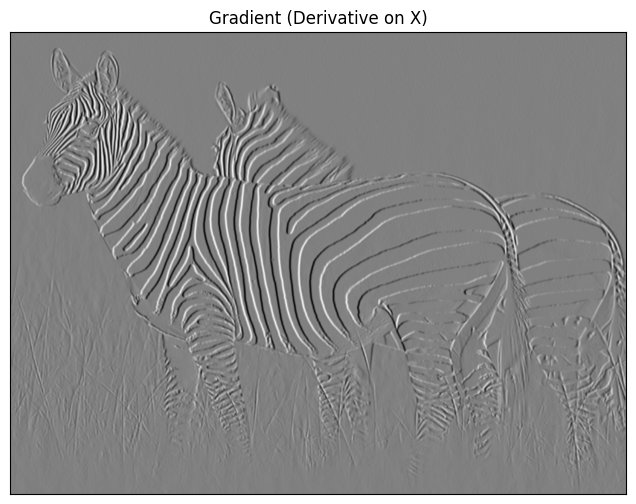

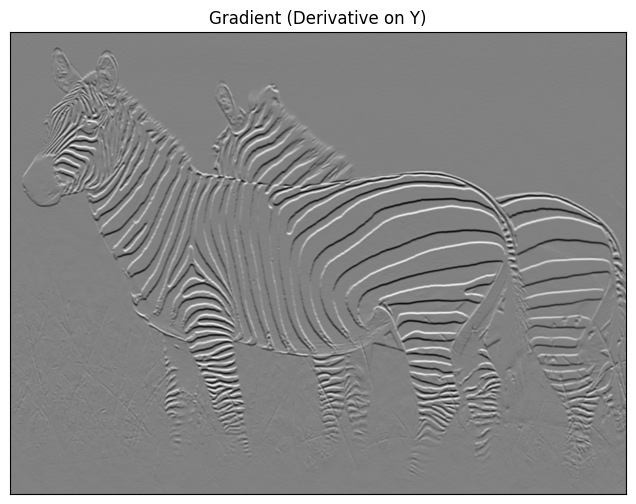

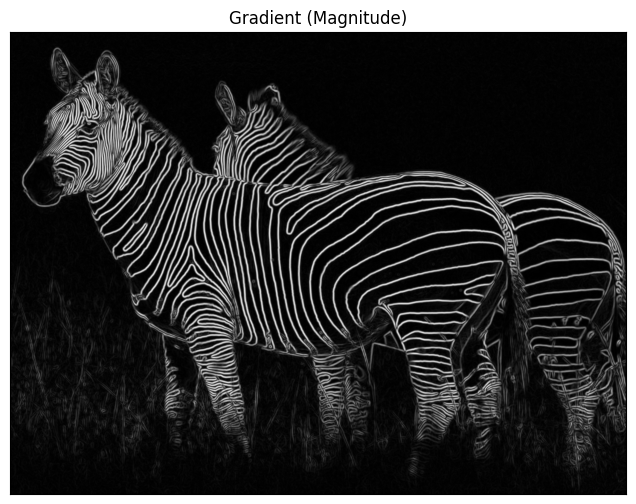

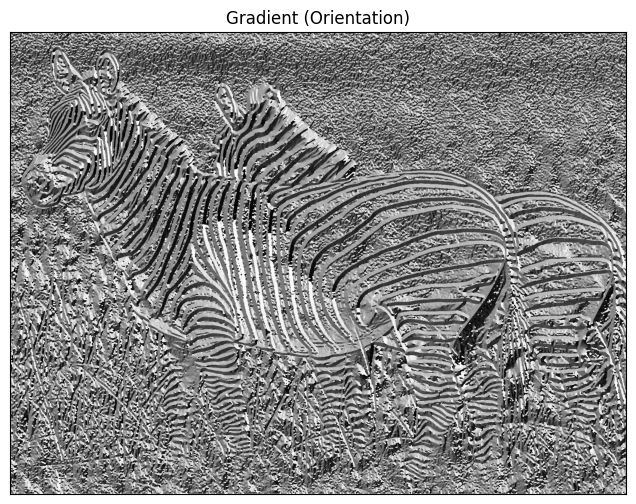

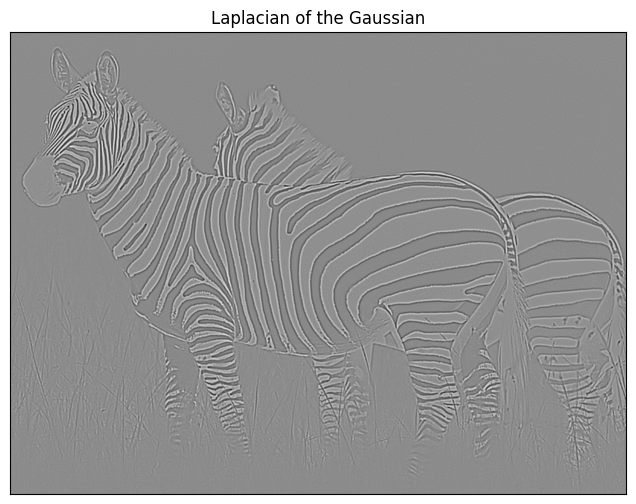

In [18]:
sigma = 2.0

# Lectura de imagen
im = cv2.imread(get_image('zebra.jpg'),0)

# Gradiente
gX, gY, magnitude, orientation = Gradient(im, sigma)

# Laplaciana de la Gaussiana
laplacian = LaplacianOfGaussian(im, sigma)

# Visualización de imágenes
displayIm(rangeDisplay01(gX, True),'Gradient (Derivative on X)',2)
displayIm(rangeDisplay01(gY, True),'Gradient (Derivative on Y)',2)
displayIm(rangeDisplay01(magnitude, True),'Gradient (Magnitude)',2)
displayIm(rangeDisplay01(orientation, True),'Gradient (Orientation)',2)
displayIm(rangeDisplay01(laplacian, True),'Laplacian of the Gaussian',2)

Como ya se comentó en el apartado B) de este ejercicio, la primera y la segunda derivada de la función Gaussiana nos sirve para detectar bordes en el eje correspondiente. En las imágenes `Gradient (Derivative on X)` se aprecia la detección de bordes en el eje X y lo mismo para `Gradient (Derivative on Y)` en el eje Y. Con la magnitud del gradiente, estamos detectando bordes en todas las direcciones, tal y como se aprecia en `Gradient (Magnitude)`. Finalmente, con la orientación del gradiente, obtenemos información sobre la dirección de los bordes detectados, tal y como se muestra en `Gradient (Orientation)`, lo cual es valioso en aplicaciones donde la dirección de los bordes es crucial, como podría ser el reconocimiento de objetos en imágenes.

Finalmente, se ha implementado la Laplaciana de la Gaussiana, cuya expresión matemática viene dada por:

<font color='60a2dd'>$$L = \sigma^2 ( G_{xx}(x,y,\sigma) + G_{yy}(x,y, \sigma))$$

Este filtro combina dos operaciones importantes: el suavizado mediante un filtro Gaussiano y la detección de bordes mediante el operador Laplaciano. La multiplicación por $\sigma^2$ sirve para escalar/normalizar la máscara, pero a la hora de la implementación no lo hemos puesto en la función `LaplacianOfGaussian()` ya que esta normalización ya se introdujo en las máscaras del apartado A), concretamente en la función `calculateGaussMask()`. En la imagen `Laplacian of Gaussian` se aprecia la detección de bordes en todas las direcciones, tal y como se esperaba.

Lo más destacable del filtro LoG es que, debido al suavizado previo con el filtro Gaussiano, es capaz de detectar bordes a diferentes escalas en la imagen. Esto significa que puede encontrar bordes tanto en regiones de alta frecuencia (bordes finos) como en regiones de baja frecuencia (bordes gruesos) sin necesidad de ajustar manualmente el tamaño del kernel del filtro.


### <font color='60a2dd'> Comparativa con `cv2.Sobel()`, `cv2.magnitude()`, `cv2.phase` y `cv2.Laplacian()`

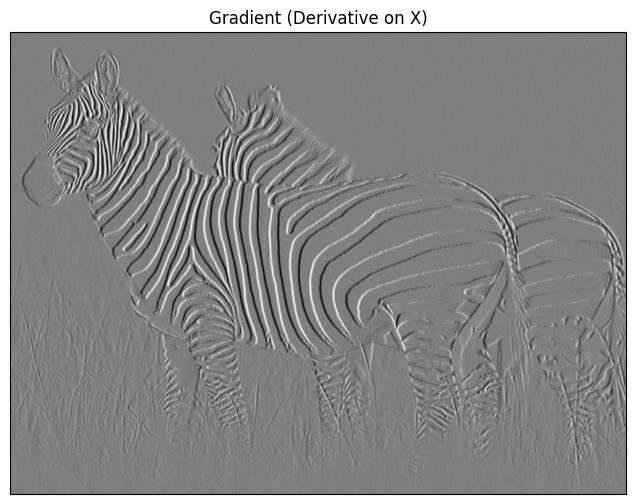

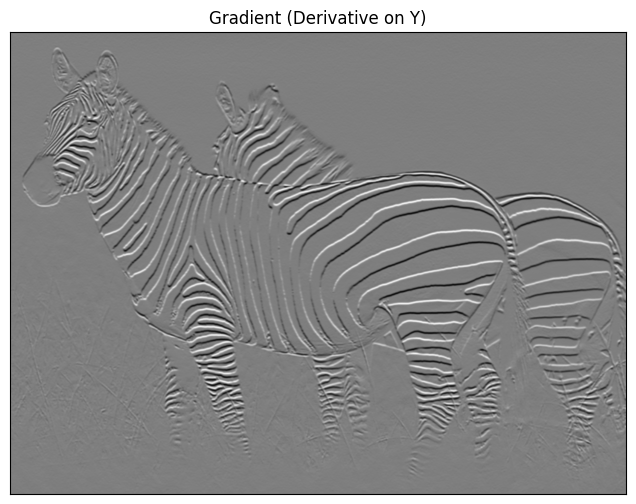

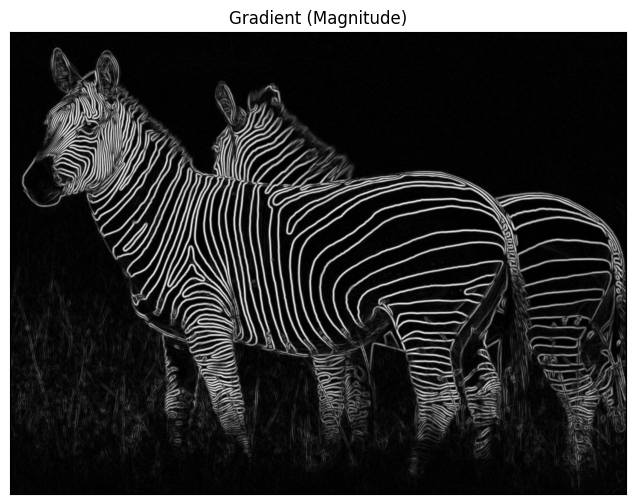

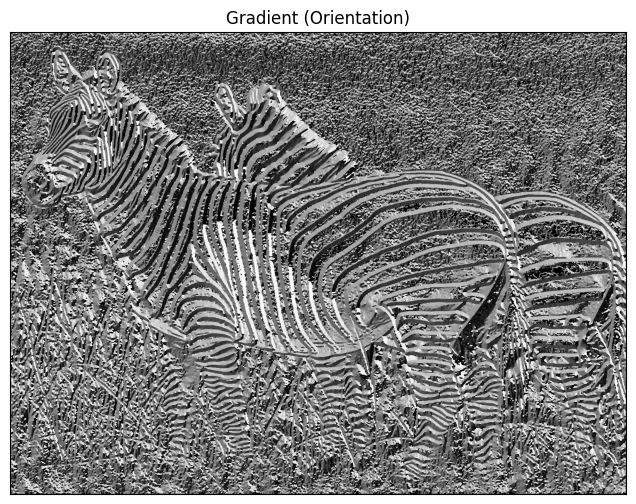

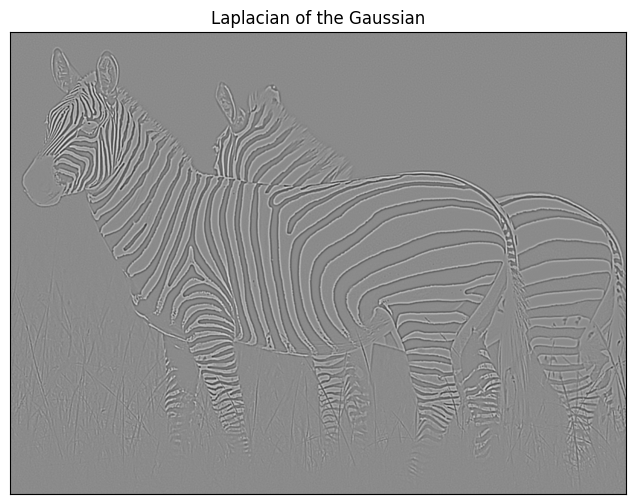

In [19]:
sigma = 2.0

# Lectura de imagen
im = cv2.imread(get_image('zebra.jpg'),0)

# Deducir el tamaño de la máscara a partir del sigma
ksize = DeductSizeMaskFromSigma(sigma)

# Aplicar un filtro Gaussiano para suavizar la imagen
blurIm = cv2.GaussianBlur(im, (0,0), sigmaX=sigma)

# Derivada en X del Gradiente
gX = cv2.Sobel(blurIm, cv2.CV_64F, 1, 0, ksize)

# Derivada en Y del Gradiente
gY = cv2.Sobel(blurIm, cv2.CV_64F, 0, 1, ksize)

# Magnitud del Gradiente
magnitude = cv2.magnitude(gX, gY)

# Orientación del Gradiente
orientation = cv2.phase(gX, gY, angleInDegrees=True)

# Laplaciana de la Gaussiana
laplacian = cv2.Laplacian(blurIm, cv2.CV_64F)

# Visualización de imágenes
displayIm(rangeDisplay01(gX, True),'Gradient (Derivative on X)',2)
displayIm(rangeDisplay01(gY, True),'Gradient (Derivative on Y)',2)
displayIm(rangeDisplay01(magnitude, True),'Gradient (Magnitude)',2)
displayIm(rangeDisplay01(orientation, True),'Gradient (Orientation)',2)
displayIm(rangeDisplay01(laplacian, True),'Laplacian of the Gaussian',2)

### <font color='60a2dd'> Conclusiones de la comparativa

Observamos que los resultados obtenidos por las funciones de OpenCV son visualmente idénticos a los resultados obtenidos por nuestras funciones. Donde más se puede apreciar una mayor diferencia es en el fondo de `Gradient (Orientation)`, el cual, si usamos las funciones de OpenCV, tiene más píxeles de color negro con respecto a la imagen proporcionada al usar nuestras funciones.

### <font color='60a2dd'> Comparativa Analítica (Error Medio por Píxel)
Para hacer una comparativa analítica de las imágenes, podemos definir una función que calcule el error medio por píxel entre dos imágenes. A continuación, implementamos dicha función y realizamos una comparación analítica entre las imágenes obtenidas para este apartado usando nuestras funciones y las imágenes obtenidas para este apartado usando las funciones de OpenCV:

In [20]:
def AverageErrorPerPixel(im1, im2):
    '''
    Esta función calcula y devuelve el error medio por píxel entre dos imágenes
    '''
    print('Error per pixel: ',np.sqrt(np.linalg.norm(im1-np.round(im2), ord=2)/np.prod(im1.shape)))

In [21]:
sigma = 2.0

# Lectura de imagen
im = cv2.imread(get_image('zebra.jpg'),0)

# Deducir el tamaño de la máscara a partir del sigma
ksize = DeductSizeMaskFromSigma(sigma)

# Aplicar un filtro Gaussiano para suavizar la imagen
blurIm = cv2.GaussianBlur(im, (0,0), sigmaX=sigma)

# Derivada en X del Gradiente
print('GRADIENT (DERIVATIVE ON X)')
AverageErrorPerPixel(cv2.Sobel(blurIm, cv2.CV_64F, 1, 0, ksize), Gradient(im, sigma)[0])

# Derivada en Y del Gradiente
print('\nGRADIENT (DERIVATIVE ON Y)')
AverageErrorPerPixel(cv2.Sobel(blurIm, cv2.CV_64F, 0, 1, ksize), Gradient(im, sigma)[1])

# Magnitud del Gradiente
print('\nGRADIENT (MAGNITUDE)')
AverageErrorPerPixel(cv2.magnitude(cv2.Sobel(blurIm, cv2.CV_64F, 1, 0, ksize),
                                   cv2.Sobel(blurIm, cv2.CV_64F, 0, 1, ksize)
                                  ),
                     Gradient(im, sigma)[2]
                    )

# Orientación del Gradiente
print('\nGRADIENT (ORIENTATION)')
AverageErrorPerPixel(cv2.phase(cv2.Sobel(blurIm, cv2.CV_64F, 1, 0, ksize),
                               cv2.Sobel(blurIm, cv2.CV_64F, 0, 1, ksize),
                               angleInDegrees=True
                              ),
                     Gradient(im, sigma)[3]
                    )

# Laplaciana de la Gaussiana
print('\nLAPLACIAN OF THE GAUSSIAN')
AverageErrorPerPixel(cv2.Laplacian(blurIm, cv2.CV_64F), LaplacianOfGaussian(im, sigma))


GRADIENT (DERIVATIVE ON X)
Error per pixel:  0.13673612377137173

GRADIENT (DERIVATIVE ON Y)
Error per pixel:  0.14603660353986142

GRADIENT (MAGNITUDE)
Error per pixel:  0.08751780329307307

GRADIENT (ORIENTATION)
Error per pixel:  0.3111412901795849

LAPLACIAN OF THE GAUSSIAN
Error per pixel:  0.10273659627300104


Vemos que los errores medios por píxel no son idénticamente cero pero sí que son relativamente bajos parecen indicar que las diferencias entre las imágenes son relativamente pequeñas. Como era de esperar, el mayor error medio por píxel se obtiene en `gradientIM (Orientation)` debido a los píxeles del fondo de la imagen como ya se comentó anteriormente.

### <font color='60a2dd'> Comparativa con `cv2.Canny()`

Aplicamos el algoritmo Canny Edge Detector visto en teoría mediante la función `cv2.Canny()` de OpenCV y, al igual que hemos hecho anteriormente, realizamos una comparativa visual de la imagen obtenida por dicha función con la imagen obtenida de la magnitud del gradiente gaussiano al usar nuestras propias funciones.

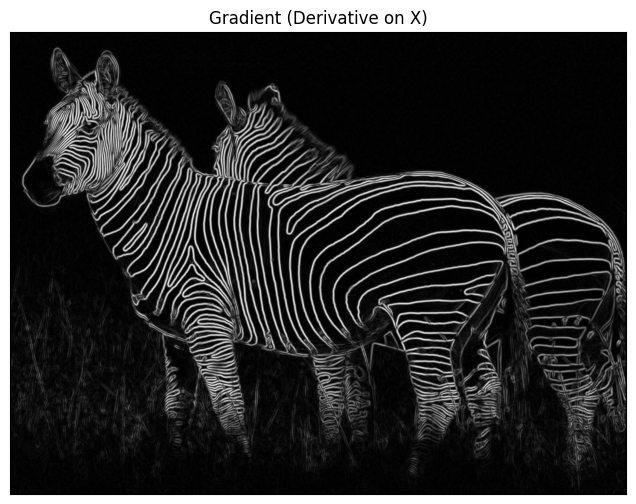

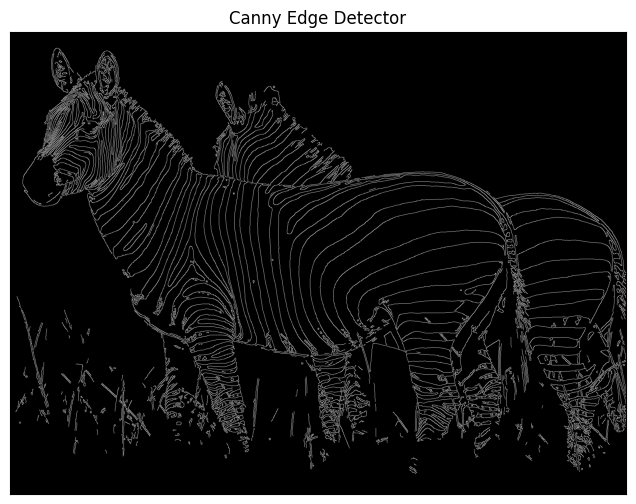

In [22]:
sigma = 2.0

# Lectura de imagen
im = cv2.imread(get_image('zebra.jpg'),0)

# Magnitud del Gradiente
_, _, magnitude, _ = Gradient(im, sigma)

# Canny Edge Detector (establecemos umbralBajo = 100 y umbralAlto = 200,
# pero se podrían haber elegido otros valores para los umbrales)
cannyEdgesIm = cv2.Canny(im, 100, 200)

# Visualización de imágenes
displayIm(rangeDisplay01(magnitude, True),'Gradient (Derivative on X)',2)
displayIm(rangeDisplay01(cannyEdgesIm, True),'Canny Edge Detector',2)

### <font color='60a2dd'> Conclusiones de la comparativa


Se observa claramente que la función `cv2.Canny()` nos proporciona una detección de bordes mucho más precisa que la detección realiza por nuestras funciones (el borde es más fino, es decir, más preciso). A pesar de ser un algoritmo de 1986, el algoritmo Canny Edge Detector sigue siendo muy popular hoy en día debido a su facilidad para ser implementado, su pequeño número de parámetros (los cuales son intuitivos), su eficiencia computacional y los buenos resultados que proporciona (tal y como hemos podido comprobar).

## D) (1.5 puntos)

Implemente una función para realizar "a mano" la convolución separable (es decir, empleando kernels 1D). Dicha función debe recibir como entrada una imagen (con el _padding_ adecuado, en caso de que lo necesite, ya incorporado) y un kernel 1D, y debe proporcionar como salida la imagen convolucionada con el kernel en ambas direcciones.

Una vez haya implementado la función, realice el suavizado de la imagen `motorcycle.bmp` (usando un _Gaussian kernel size_ de 7, y dejando que sea la propia función de creación del kernel la que determine el $\sigma$ adecuado), y compare el resultado con el de `cv2.GaussianBlur` (en donde se debe optar por la misma estrategia: fijando $ksize=7$ y dejando que sea la propia función de OpenCV la que escoja el sigma). ¿Hay diferencias (sea a nivel de resultado final o de tiempo de ejecución)? En caso afirmativo, ¿a qué se pueden deber?

In [23]:
import numpy as np
import cv2
import time

def convolve1D(image, kernel):
    # Asumimos que el padding ya está aplicado en la imagen
    kernel_size = len(kernel)
    pad_size = kernel_size // 2
    output = np.zeros_like(image)

    # Desplazamos el kernel a lo largo de las filas o columnas de la imagen
    for i in range(image.shape[0]):
        for j in range(pad_size, image.shape[1] - pad_size):
            output[i, j] = np.sum(image[i, j - pad_size:j + pad_size + 1] * kernel)

    return output

def convolve2D(image, kx, ky):
    # Paso 1: Convolución horizontal con kx
    image_convolved_x = convolve1D(image, kx)

    # Paso 2: Transponer la imagen y aplicar la convolución vertical con ky (ahora es horizontal en la imagen transpuesta)
    image_convolved_y = convolve1D(image_convolved_x.T, ky)

    # Regresamos la imagen a su orientación original
    return image_convolved_y.T


In [24]:
'''
Para obtener el kernel gaussiano 1D, podemos usar la función cv2.getGaussianKernel,
que nos permite definir el tamaño y dejar que la función elija el sigma adecuado.
'''
def gaussian_kernel_1D(ksize):
    return cv2.getGaussianKernel(ksize, -1)


Comparar con OpenCV GaussianBlur

Ahora, cargamos la imagen, aplicamos nuestro suavizado con la convolución separable y lo comparamos con el resultado de OpenCV:

In [25]:
# Cargar imagen
filename = 'motorcycle.bmp'
image = cv2.imread(get_image('motorcycle.bmp'),0)


# Verificar si la imagen se cargó correctamente
if image is None:
    print(f"Error: No se pudo cargar la imagen '{filename}'. Verifica la ruta y el nombre del archivo.")
    exit() # Salir del programa si no se pudo cargar la imagen

# Definir tamaño de kernel gaussiano
ksize = 7

# Crear kernel 1D Gaussiano
kernel_1D = gaussian_kernel_1D(ksize)

# Aplicar convolución separable
start_time = time.time()
smoothed_custom = convolve2D(image, kernel_1D, kernel_1D)
end_time = time.time()
custom_time = end_time - start_time

# Aplicar suavizado con OpenCV GaussianBlur
start_time = time.time()
smoothed_cv2 = cv2.GaussianBlur(image, (ksize, ksize), 0)
end_time = time.time()
cv2_time = end_time - start_time

# Mostrar o guardar resultados
cv2.imwrite('custom_gaussian_blur.bmp', smoothed_custom)
cv2.imwrite('cv2_gaussian_blur.bmp', smoothed_cv2)

print(f"Tiempo con convolución separable: {custom_time:.6f} segundos")
print(f"Tiempo con OpenCV GaussianBlur: {cv2_time:.6f} segundos")

Tiempo con convolución separable: 3.387342 segundos
Tiempo con OpenCV GaussianBlur: 0.001713 segundos


###Comparación
Diferencias en el resultado: A nivel visual, ambos métodos producen resultados muy similares, ya que ambos implementan la misma operación de suavizado gaussiano.
Diferencias en tiempo de ejecución: Notamos que cv2.GaussianBlur es significativamente más rápido. Esto se debe a que OpenCV está optimizado en bajo nivel (C/C++ y uso de SIMD o multihilos). Esta implementación, aunque funcional, no está tan optimizada como OpenCV y depende de la ejecución en Python puro.
Las diferencias de tiempo se deben principalmente a la eficiencia de la implementación interna de OpenCV, que aprovecha mejor los recursos del sistema y puede trabajar con imágenes grandes mucho más rápido que la implementación "manual".

## E) (0.5 puntos)

Las herramientas de IA generativa son de gran utilidad tanto para estudiantes como para docentes. No obstante, resulta fundamental tener una actitud crítica y asumir desde el principio que las respuestas proporcionadas por estas herramientas pueden ser factualmente incorrectas (véase,  por ejemplo, https://elpais.com/tecnologia/2024-09-25/los-nuevos-modelos-de-ia-como-chatgpt-persiguen-la-superinteligencia-pero-no-logran-ser-fiables-ni-en-preguntas-bobas.html). En este sentido, vale la pena recordar lo que indica la guía de la UGR (https://ceprud.ugr.es/formacion-tic/inteligencia-artificial): _"Debes revisar siempre la salida que genera y las posibles referencias que utilice. [...] Mejora tus resultados con la IAGen aprendiendo a usarla y a comunicarte con ella de manera adecuada. Pero no dejes que piense por ti."_

En este apartado trabajaremos de forma crítica la utilidad de estas herramientas. Para ello, el alumnado debe emplear ChatGPT (https://chatgpt.com/) para consultar _"en qué consiste y para qué sirve la normalización de escala, así como por qué, en dicha normalización de escala, se multiplica por $\sigma^n$, siendo $n$ el orden de derivada"_. No se trata meramente de copiar lo que indique ChatGPT como salida, sino de analizar y matizar su respuesta, confrontándola con otras lecturas y lo que el estudiante sabe de la teoría, indicando en qué aspectos dicha respuesta puede considerarse correcta y en qué aspectos quizás no lo es.

Para analizar y matizar la respuesta dada por ChatGPT sobre la normalización de escala, es importante desglosar los conceptos involucrados y contrastarlos con lo que la teoría sugiere y lo que otras lecturas pueden ofrecer. Veamos cada aspecto en detalle y tratemos de confrontar la respuesta original con otras fuentes teóricas y observaciones prácticas.

1. Normalización de escala y su propósito
En la respuesta inicial, se enfatizó que la normalización de escala es una técnica para que las características detectadas sean independientes del tamaño o escala de los objetos en una imagen. Este aspecto es completamente correcto y está bien fundamentado en la teoría. La normalización de escala es crítica en tareas de procesamiento de imágenes multiescala, donde se busca que las estructuras de una imagen se puedan detectar a diferentes escalas sin perder información clave o hacer que la magnitud de las respuestas varíe innecesariamente.

Sin embargo, es importante matizar que esta técnica se enmarca dentro de los detectores invariantes a escala. Un aspecto no mencionado en la respuesta original es que no siempre se necesita normalización de escala, especialmente cuando las imágenes o patrones tienen una escala fija o no varían significativamente en tamaño. En escenarios donde la escala de los objetos es consistente o controlada, la normalización podría no ser relevante.

2. Factor
𝜎^𝑛
σ
n
  en la normalización
El punto central de la respuesta anterior es la explicación sobre por qué se multiplica por
𝜎^𝑛
  en la normalización de escala. Esto es generalmente correcto, ya que la derivada de una imagen suavizada por un filtro gaussiano
𝐺
(
𝑥
,
𝑦
;
𝜎
)
G(x,y;σ) tiende a disminuir en magnitud a medida que
𝜎
σ aumenta. Este fenómeno está documentado en la teoría de procesamiento de imágenes y es un hecho bien conocido en literatura sobre espacios de escala (scale spaces). La multiplicación por
𝜎^𝑛

 , donde
𝑛
n es el orden de la derivada, es una forma estándar de normalización de la respuesta de las derivadas para mantener la invariancia a escala.

Sin embargo, hay un matiz adicional que debe considerarse. En algunos casos, la normalización no es estrictamente lineal con
𝜎^𝑛
 . Dependiendo del contexto y del tipo de característica que se está detectando, la normalización puede implicar otros factores adicionales. Por ejemplo:

En la detección de blobs (regiones homogéneas en intensidad), la multiplicación por
𝜎^2
  en la segunda derivada es correcta, pero hay variantes de detectores que introducen otros términos de ajuste en función del tipo de imagen o del dominio de aplicación.
En algunos métodos avanzados, se usan normalizaciones dependientes de funciones no lineales de
𝜎
σ, especialmente en aplicaciones de aprendizaje automático.
Otro aspecto interesante que podría mencionarse es que esta normalización está fuertemente asociada con la transformada gaussiana de escala, un marco teórico formalizado por Lindeberg en el desarrollo del concepto de "espacios de escala" (scale-space theory). La teoría ofrece una base sólida para entender cómo aplicar suavizado gaussiano y sus derivadas a diferentes escalas.

3. Convolución Gaussiana y suavizado multiescala
La respuesta también señala correctamente que al cambiar el valor de
𝜎
σ, se suavizan diferentes estructuras de la imagen: los detalles más pequeños se filtran a escalas grandes y los detalles más grandes permanecen. Este principio es fundamental en la teoría de procesamiento multiescala, y es lo que permite detectar estructuras a diferentes niveles de detalle.

Para matizar esta idea, podríamos agregar que la normalización no solo busca uniformizar la magnitud de las respuestas de las derivadas, sino también realzar estructuras significativas a escalas donde estas son más evidentes. Por ejemplo:

Para detectar bordes, un suavizado con un
𝜎
σ pequeño capturará bordes finos y detalles pequeños, mientras que un suavizado con un
𝜎
σ grande capturará bordes que definen grandes estructuras.
El hecho de que diferentes aplicaciones (como detección de bordes, blobs o esquinas) utilicen diferentes valores de
𝜎
σ para capturar la información deseada es clave para entender por qué la normalización con
𝜎^𝑛
  es una técnica tan efectiva.

4. Tiempo de ejecución y optimización
La respuesta menciona que la normalización de escala puede tener un impacto en el tiempo de ejecución y que OpenCV es más eficiente que una implementación manual. Si bien esto es cierto, se podría matizar que la eficiencia de la implementación de OpenCV no solo se debe a la optimización del algoritmo de convolución, sino también a que OpenCV está diseñado para aprovechar capacidades de hardware específicas, como la paralelización en CPU y GPU, el uso de instrucciones vectoriales (SIMD), y otras optimizaciones de bajo nivel.

Una observación adicional sería que, en entornos donde se maneja mucho procesamiento en tiempo real, como la visión por computadora en robótica o aplicaciones móviles, la normalización de escala puede introducir sobrecarga computacional significativa si no se aplica correctamente. Por lo tanto, algunos sistemas podrían optar por enfoques aproximados o adaptativos para evitar el costo computacional que conlleva la convolución y normalización a múltiples escalas.

# **Ejercicio 2**:  Pirámides Gaussianas y Laplacianas (3 points)







## A) (1.5 puntos)

Construya una pirámide Gaussiana de 4 niveles empleando máscaras Gaussianas de tamaño $7\times7$. No se permite emplear las funciones `pyrUp()` y `pyrDown()` de OpenCV, ni tampoco `cv2.resize()`.

En ocasiones, podemos necesitar trabajar con una imagen a diferentes resoluciones. Por ejemplo, si buscamos algo concreto, como una cara, y no sabemos a priori el tamaño del objeto buscado, o si necesitamos acceder a una imagen con distintos niveles de difuminación/suavizado (blur), o si necesitamos comprimir una imagen, etc. Por ello, aunque estemos habituados a trabajar con imágenes de tamaño fijo, no hay que olvidarse de la importancia de las pirámides de imágenes.

Por ello, en este apartado vamos a construir una Pirámide Gaussiana, la cual consta de una serie de imágenes en diferentes escalas de resolución, desde la imagen original de alta resolución hasta versiones sucesivamente más pequeñas (técnica conocida como "sub-sampling") y suavizadas de la misma imagen (el suavizado de la imagen se realiza para evitar el fenómeno conocido como "aliasing", el cual ocurre cuando la frecuencia de muestreo, ya sea temporal o espacial, no es lo suficientemente alta para capturar la cantidad de detalles en la imagen, pudiendo darse una imagen errónea, también llamada "alias". Si no suavizáramos, el "aliasing" podría darse tras realizar "sub-sampling"). Cada nivel de la pirámide puede considerarse como una representación de la imagen en una escala específica.

In [26]:
'''
This function displays a pyramid of images, providing as input the list of images to display.

Example of use:
im1=readIm(get_image('apple.jpg'),1)
images = [im1, cv2.resize(im1,(im1.shape[0]//2,im1.shape[1]//2),cv2.INTER_LINEAR), cv2.resize(im1,(im1.shape[0]//4,im1.shape[1]//4),cv2.INTER_LINEAR), cv2.resize(im1,(im1.shape[0]//8,im1.shape[1]//8),cv2.INTER_LINEAR), cv2.resize(im1,(im1.shape[0]//16,im1.shape[1]//16),cv2.INTER_LINEAR)]

displayPyramid(images, title='Piramide de Manzanas')

'''
def displayPyramid(vim, title='result'):
  temp = np.zeros_like(vim[0])
  if np.mod(temp.shape[1],2)==0:
    h = temp[:, :temp.shape[1]//2]
  else:
    h = temp[:, :(temp.shape[1]//2)+1]
  out = np.hstack((temp, h))
  top = 0
  out[0:vim[0].shape[0], 0:vim[0].shape[1]] = vim[0]
  left = vim[0].shape[1]
  for i in range(1, len(vim)):
    out[top:top+vim[i].shape[0], left:left + vim[i].shape[1]] = vim[i]
    top += vim[i].shape[0]
  displayIm(out, title)

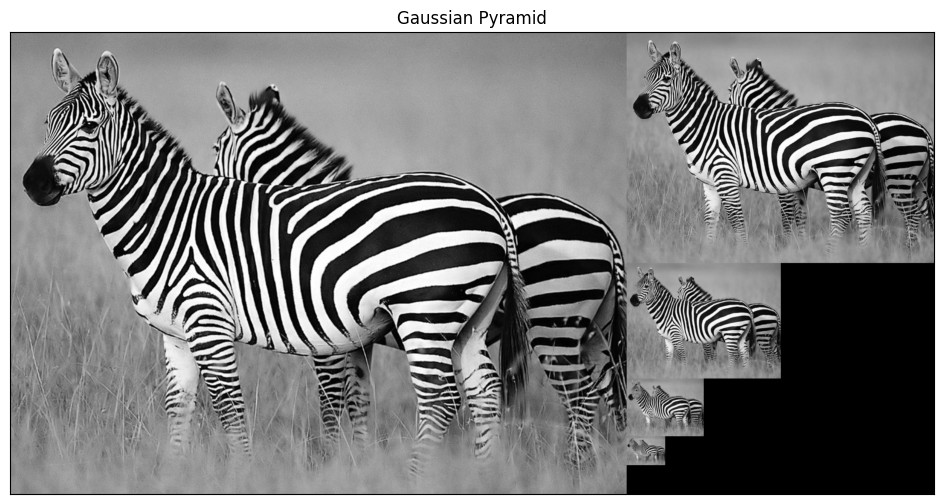

In [27]:
def pyramidGauss(im, sizeMask=7, nlevel=4):
  '''
  Esta función calcula una Pirámide Gaussiana de 'nlevel' niveles a partir de la imagen 'im'
  '''
  # Vector de imágenes (Pirámide)
  vim=[im]   # Guardamos la imagen original como base de la pirámide

  sigma = DeductSigmaFromSizeMask(sizeMask)

  # Para cada imagen del nivel correspondiente de la pirámide
  for i in range(nlevel):
    # Aplicar un filtro Gaussiano para suavizar la imagen del nivel anterior de la pirámide
    smoothedIm = my2DConv(vim[i], sigma, [0,0])
    # Reducir el tamaño de la imagen del nivel anterior de la pirámide a la mitad tanto en filas como en columnas
    # Es decir, la nueva imagen será, en terminos de tamaño, 1/4 de la imagen del nivel anterior de la pirámide
    reducedIm = cv2.resize(smoothedIm, (smoothedIm.shape[1] // 2, smoothedIm.shape[0] // 2), cv2.INTER_LINEAR)
    # La nueva imagen ya suavizada y reducida será el nuevo nivel de la pirámide
    vim.append(reducedIm)

  return vim

# Lectura de imagen
im = cv2.imread(get_image('zebra.jpg'),0)

# Pirámide Gaussiana
pyrG = pyramidGauss(im, sizeMask=7, nlevel=4)

# Visualización de la Pirámide Gaussiana
displayPyramid(pyrG,'Gaussian Pyramid')


Vemos que el proceso de construcción de la Pirámide Gaussiana consta de los siguientes pasos:

1.   Iniciar con la imagen original, que se considera el nivel de mayor resolución.

2.   Aplicar una operación de suavizado a la imagen original utilizando un filtro gaussiano (eliminando así altas frecuencias y reduciendo el ruido).

3.   Reducir la resolución de la imagen resultante ("subsampling"), creándose así una versión más pequeña de la imagen original pero que aún contiene información importante. La nueva imagen será, en terminos de tamaño, 1/4 de la imagen del nivel anterior de la pirámide.

4.   Repetir los pasos 2 y 3 varias veces (tantas veces como niveles que queramos que tenga nuestra pirámide) para crear múltiples niveles de la pirámide, donde cada nivel tiene una resolución menor que el anterior.

Como podemos apreciar en la Pirámide Gaussiana que hemos construído como ejemplo, la primera imagen es la imagen original, y, en los sucesivos niveles de la pirámide, la imagen se va reduciendo y se va viendo más emborronada, reteniendo efectivamente las frecuencias bajas en cada paso.

###<font color='60a2dd'> Comparativa con `cv2.pyrDown()`

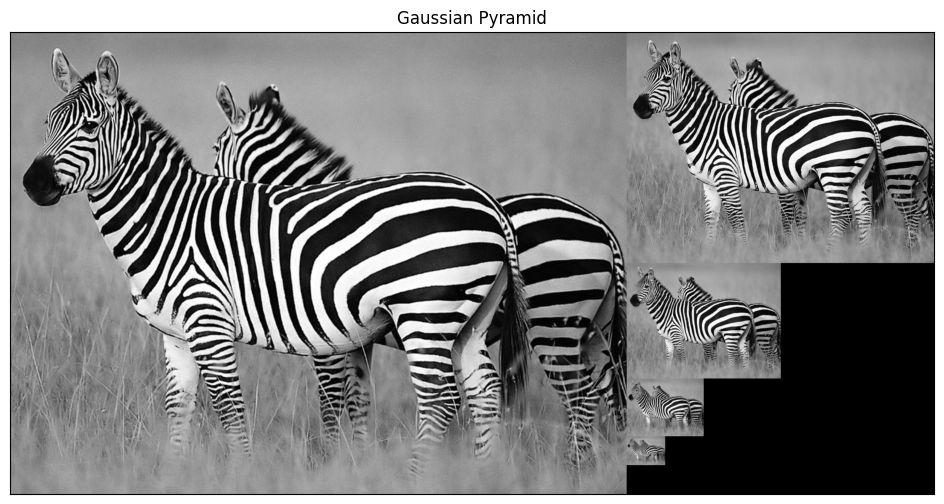


GAUSSIAN PYRAMID
NLEVEL --> 0
Error per pixel:  0.0
NLEVEL --> 1
Error per pixel:  0.04043204269207464
NLEVEL --> 2
Error per pixel:  0.09217426023780777
NLEVEL --> 3
Error per pixel:  0.17742331031353703
NLEVEL --> 4
Error per pixel:  0.29816403972709427


In [28]:
# Lectura de imagen
im = cv2.imread(get_image('zebra.jpg'),0)

nlevel = 4  # Número de niveles de la Pirámide Gaussiana

# Pirámide Gaussiana de OpenCV
pyrGaussCV = [im]
for i in range(nlevel): # Para cada nivel, añadimos lo devuelto por pyrDown() con el nivel anterior
    pyrGaussCV.append(cv2.pyrDown(pyrGaussCV[i]))

# Pirámide Gaussiana de Nuestras Funciones
pyrGaussPropia = pyramidGauss(im, sizeMask=7, nlevel=4)

# Visualización de la Pirámide Gaussiana de OpenCV
displayPyramid(pyrGaussCV,'Gaussian Pyramid')

# Error Medio por Píxel
print('\nGAUSSIAN PYRAMID')
for i in range(len(pyrGaussCV)):
    print(f'NLEVEL --> {i}')
    AverageErrorPerPixel(pyrGaussCV[i], pyrGaussPropia[i])

### <font color='60a2dd'> Conclusiones de la comparativa

A primera vista, vemos que no hay diferencias apreciables entre la Pirámide Gaussiana usando nuestras propias funciones y la Pirámide Gaussiana usando `cv2.pyrDown()` de OpenCV. Vemos también que, a medida que la imagen del nivel correspondiente va suavizándose más y reduciéndose su tamaño, el error medio por píxel entre niveles de ambas pirámides va aumentando, sin embargo, dicho error no tiene un valor muy alto, haciendo que ambas Pirámides Gaussianas sean prácticamente idénticas a la hora de visualizarlas (como era de esperar).

## B) (1 punto)

Use su código del apartado anterior para implementar una función que permita construir una pirámide Laplaciana de 4 niveles.

A diferencia de la Pirámide Gaussiana, que se centra en la reducción de la resolución a través del suavizado gaussiano, la Pirámide Laplaciana se enfoca en resaltar las diferencias de detalle entre los niveles de la pirámide. Cada nivel de la Pirámide Laplaciana representa información de detalle a una escala específica, lo que permite analizar la imagen en diferentes niveles de detalle.

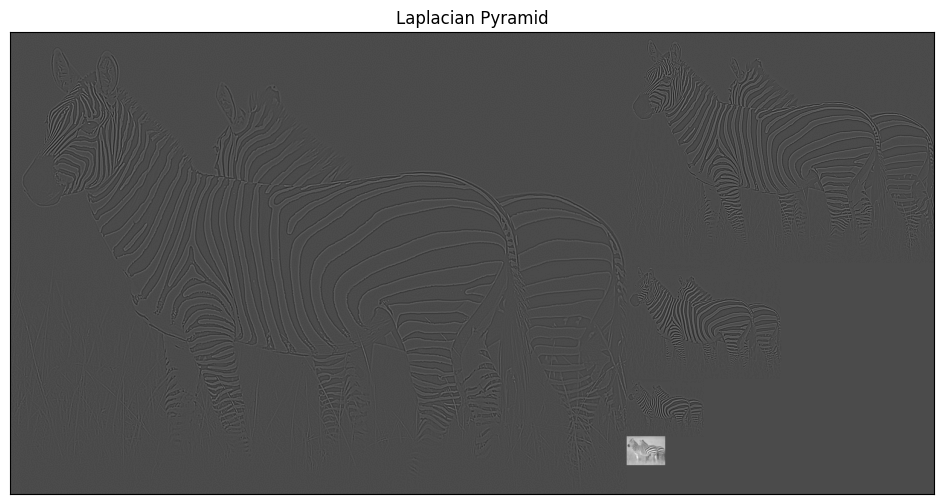

In [29]:
def pyramidLap(im, sizeMask,nlevel=4,flagInterp=cv2.INTER_LINEAR):
  '''
  Esta función calcula una Pirámide Laplaciana de 'nlevel' niveles a partir de la imagen 'im'
  '''
  vim=pyrG=pyramidGauss(im, sizeMask=sizeMask, nlevel=nlevel) # Vector de imágenes (Pirámide Gaussiana)
  vimL = []  # Vector de imágenes (Pirámide Laplaciana)
  for i in range(nlevel):
    # Expandimos la imagen de la Pirámide Gaussiana del nivel correspondiente al tamaño de
    # la imagen del nivel anterior usando la interpolación determinada por 'flagInterp' (bilineal)
    expandedIm = cv2.resize(pyrG[i+1], (pyrG[i].shape[1], pyrG[i].shape[0]), flagInterp)
    # Calculamos la imagen resultado de la diferencia entre la imagen del nivel anterior y la imagen expandida
    diffIm = pyrG[i] - expandedIm
    # Añadimos la imagen diferencia como un nuevo nivel de la Pirámide Laplaciana
    vimL.append(diffIm)

  vimL.append(pyrG[-1])  # Añadir el último nivel de la Pirámide Gaussiana a la
                         # pirámide Laplaciana  para poder reconstruir la imagen original

  return vimL

# Lectura de imagen
im = cv2.imread(get_image('zebra.jpg'),0)

# Pirámide Laplaciana
pyrL = pyramidLap(im, sizeMask=7, nlevel=4)

# Visualización de la Pirámide Laplaciana
displayPyramid(pyrL,'Laplacian Pyramid')

Vemos que el proceso de construcción de la Pirámide Laplaciana consta de los siguientes pasos:

1.   Iniciar con la imagen del nivel 1 de la Pirámide Gaussiana.

2.   Expandimos la imagen ("upsampling") de la Pirámide Gaussiana del nivel correspondiente al tamaño de la imagen del nivel anterior usando, por defecto, interpolación bilineal.

3.   Calculamos la imagen resultado de la diferencia entre la imagen del nivel anterior y la imagen expandida.

4.   Repetir los pasos 2 y 3 varias veces (tantas veces como niveles que queramos que tenga nuestra pirámide) para crear múltiples niveles de la pirámide.

Como podemos apreciar en la Pirámide Laplaciana que hemos construído como ejemplo, excepto en la última imagen (el nivel más alto de la pirámide), nos quedamos en cada nivel con las frecuencias altas de la imagen. En el último nivel de la pirámide no hacemos la diferencia, sino que guardamos las frecuencias bajas de la imagen en dicho nivel. Esto nos va a permitir, como veremos en el apartado C) de este ejercicio, reconstruir la imagen original a partir de la pirámide.

## C) (0.5 puntos)

Ahora realice la misma operación que en los apartados anteriores, pero sin suavizar antes de hacer subsampling a la hora de crear la pirámide Gaussiana. ¿Hay diferencias visuales en la pirámide Laplaciana generada? ¿A qué se pueden deber estas?

Esto implica que al reducir la imagen en cada nivel, no se aplica el filtro gaussiano para suavizar la imagen antes de la reducción, a diferencia de lo que haces en la función pyramidGauss actual.

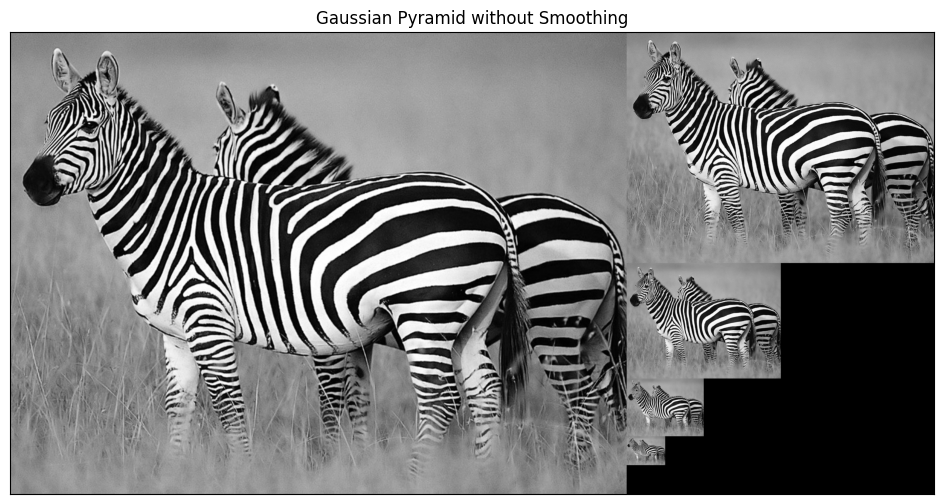

In [30]:
#Función que calcula una Pirámide Gaussiana sin suavizar antes del subsampling
def pyramidGaussNoSmoothing(im, nlevel=4):
  #Vector de imágenes
  vim = [im]

  for i in range(nlevel):
    #No suavizamos, solo reducimos el tamaño de la imagen
    reducedIm = cv2.resize(vim[i], (vim[i].shape[1] // 2, vim[i].shape[0] // 2), cv2.INTER_LINEAR)
    #La nueva imagen ya suavizada y reducida será el nuevo nivel de la Pirámide
    vim.append(reducedIm)

  return vim

#Creamos Pirámide Gaussiana sin suavizado
pyrG_no_smoothing = pyramidGaussNoSmoothing(im, nlevel=4)

#Visualizamos
displayPyramid(pyrG_no_smoothing,'Gaussian Pyramid without Smoothing')

###Comparar la pirámide Laplaciana generada
Para comparar los efectos de no suavizar antes del subsampling, vamos a generar una pirámide Laplaciana a partir de esta nueva pirámide Gaussiana sin suavizado:

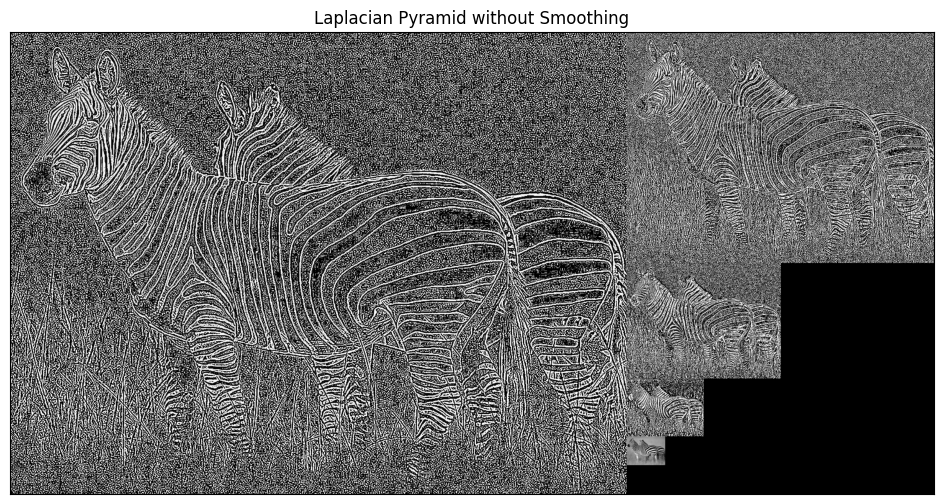

In [31]:
# Función para generar pirámide Laplaciana desde una pirámide Gaussiana sin suavizado
def pyramidLapNoSmoothing(im, nlevel=4, flagInterp=cv2.INTER_LINEAR):
    pyrG_no_smoothing = pyramidGaussNoSmoothing(im, nlevel)  # Generar pirámide Gaussiana sin suavizar
    vimL = []  # Vector de imágenes

    for i in range(nlevel):
        # Expandimos la imagen de la Pirámide Gaussiana del nivel correspondiente al tamaño del nivel anterior
        expandedIm = cv2.resize(pyrG_no_smoothing[i+1], (pyrG_no_smoothing[i].shape[1], pyrG_no_smoothing[i].shape[0]), flagInterp)
        # Calculamos la diferencia entre el nivel actual y la imagen expandida
        diffIm = pyrG_no_smoothing[i] - expandedIm
        vimL.append(diffIm)

    vimL.append(pyrG_no_smoothing[-1])  # Añadir el último nivel de la pirámide Gaussiana

    return vimL

# Crear pirámide Laplaciana sin suavizado
pyrL_no_smoothing = pyramidLapNoSmoothing(im, nlevel=4)

# Visualizar pirámide Laplaciana sin suavizado
displayPyramid(pyrL_no_smoothing, 'Laplacian Pyramid without Smoothing')


Aparición de aliasing:

Al no suavizar la imagen antes de reducirla, se produce aliasing. Este fenómeno ocurre cuando se intenta reducir la resolución de una imagen sin eliminar las frecuencias altas (detalles) primero, lo que provoca que estas frecuencias se plieguen de manera no deseada en el espacio de la imagen. Como resultado, los niveles de la pirámide tendrán artefactos visibles (líneas, patrones o texturas no deseadas).
En la pirámide Laplaciana, estos artefactos serán especialmente visibles en las imágenes de diferencia entre niveles, ya que las imágenes no están correctamente suavizadas.
Menor suavidad en la pirámide Laplaciana:

En la pirámide Laplaciana generada a partir de la pirámide Gaussiana sin suavizado, los bordes y las transiciones entre regiones de diferente intensidad serán más abruptos y menos suaves. Esto se debe a que las imágenes en los niveles superiores contienen más detalles que deberían haber sido eliminados mediante el suavizado, por lo que las diferencias entre los niveles contendrán más ruido y detalles no deseados.
Menor precisión en la reconstrucción:

Uno de los propósitos clave de la pirámide Laplaciana es poder reconstruir la imagen original a partir de los niveles de la pirámide. Al no suavizar antes del subsampling, se introducen distorsiones que afectarán la calidad de la reconstrucción. Las diferencias entre los niveles de la pirámide no representan con precisión la información que se pierde en cada nivel, lo que puede hacer que la imagen reconstruida sea menos precisa.
Razones detrás de estas diferencias
Estas diferencias visuales se deben a la falta de suavizado antes del subsampling, que es un paso crucial para evitar aliasing. El suavizado con un filtro Gaussiano elimina las frecuencias altas (detalles finos) en la imagen que no pueden ser representadas adecuadamente después de la reducción de resolución. Al omitir este paso:

Los detalles finos se pliegan sobre sí mismos y se mezclan con las frecuencias más bajas de la imagen, generando aliasing.
La pirámide Laplaciana depende de las imágenes suavizadas en cada nivel para que las diferencias entre niveles capturen la información perdida de manera efectiva. Si no se suavizan las imágenes, las diferencias entre niveles capturan información errónea o ruidosa.

## D) (0.5 puntos)

Implemente ahora una función para reconstruir la imagen codificada en la pirámide Laplaciana del apartado 2.B. Verifique que es posible obtener una copia exacta de la imagen original. Para ello, calcule el error de reconstrucción como el _Root Mean Squared Error_ (RMSE) entre los niveles de intensidad de la imagen original y la imagen reconstruida.

En este apartado vemos que es posible reconstruir perfectamente la imagen original a partir de una pirámide Laplaciana. De hecho, dicha reconstrucción perfecta no depende ni del sigma, ni de la interpolación utilizada... Simplemente depende de que se programe bien. Esto puede parecer sorprendente de primeras, pero en realidad tiene sentido ya que el Teorema de muestreo de Nyquist-Shannon nos dice que tras el suavizado de una imagen, hay píxeles redundantes. Por tanto, podemos descartarlos (por medio de submuestreo) sin perder información. De esta forma, nosotros tenemos toda la información necesaria ya que disponemos de una versión reducida de la imagen original, y todos los detalles (altas frecuencias) a distintas escalas, lo cual nos permite obtener una copia exacta de la imagen original a partir de la imagen del último nivel de la Pirámide Laplaciana.

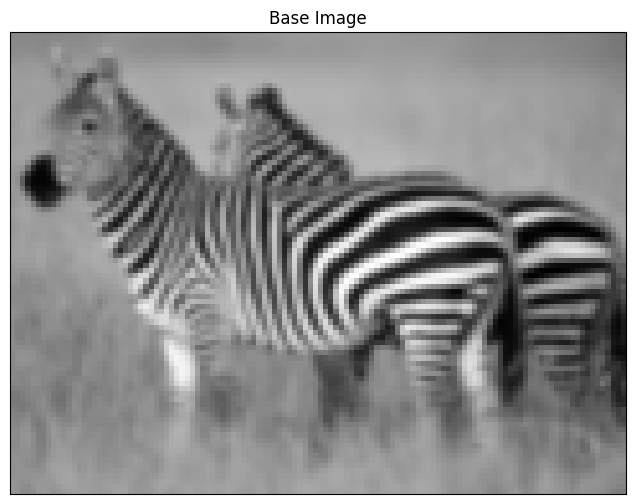

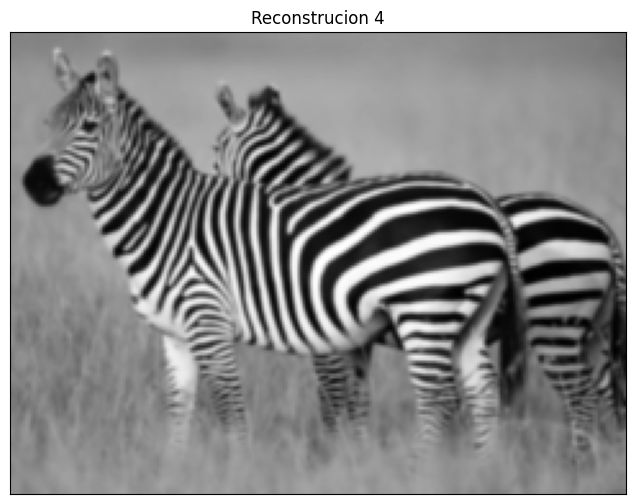

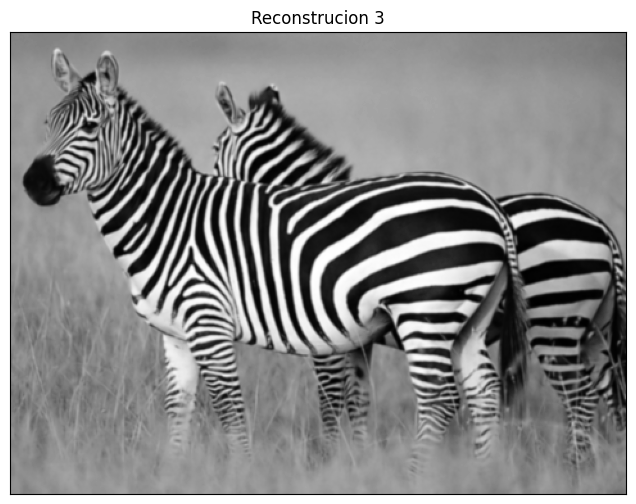

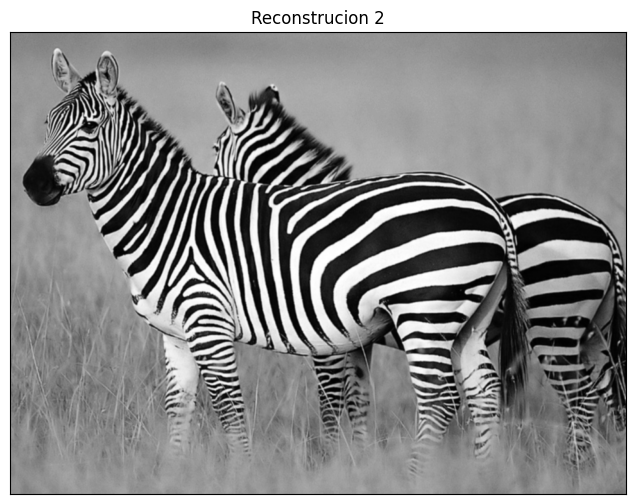

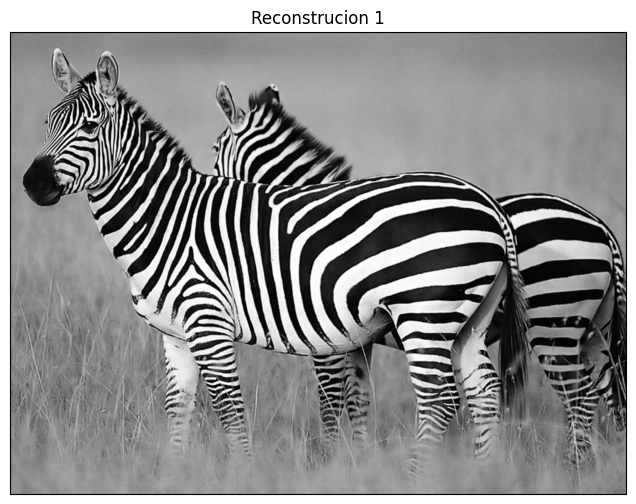

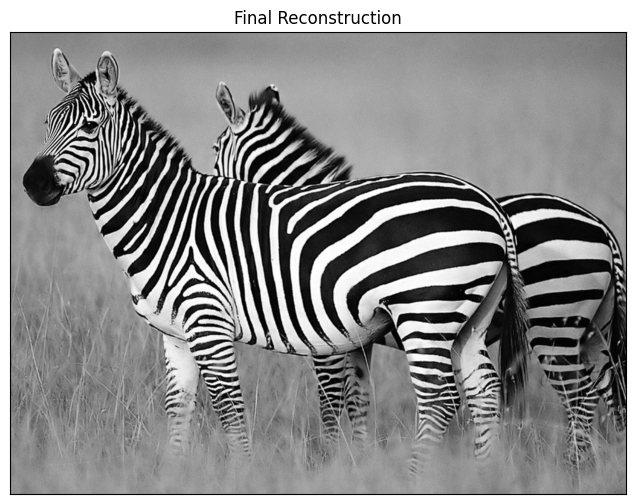

Error per pixel 0.0


In [32]:
def reconstructLap(pyL,flagInterp):
  '''
  Esta función reconstruye la imagen codificada en la Pirámide Laplaciana,
  obteniéndose una copia exacta de la imagen original
  '''
  pyrRecons = [pyL[len(pyL)-1]] # Pirámide de Reconstrucción (inicialmente, solo contiene la imagen codificada)
  im = pyL.pop()  # Imagen codificada ( Imagen del mayor nivel de la Pirámide Laplaciana)

  # Recorremos la Pirámide Laplaciana desde el nivel más alto hasta el más bajo
  for image in pyL[::-1]:
    # Expandir la imagen del nivel correspondiente al tamaño de la imagen del nivel anterior
    # usando la interpolación determinada por 'flagInterp' (bilineal)
    expandedIm = cv2.resize(im, (image.shape[1], image.shape[0]), flagInterp)
    # Actualizamos la imagen codificada 'im' como la suma entre la imagen del nivel correspondiente y la imagen expandida
    im = image + expandedIm
    # Añadimos la imagen codificada 'im' actualizada como un nuevo nivel de la Pirámide de Reconstrucción
    pyrRecons.append(im)

  return pyrRecons, im

# Lectura de imagen
im = cv2.imread(get_image('zebra.jpg'), 0)

# Pirámide Laplaciana
pyL = pyramidLap(im, sizeMask=7, nlevel=4)

# Pirámide de Reconstrucción e Imagen Reconstruida
pyrRecons, recons = reconstructLap(pyL, cv2.INTER_LINEAR)

# Visualización de imágenes
displayIm(rangeDisplay01(pyrRecons[0], True),'Base Image',2)
for i in range(1, len(pyrRecons)):
  displayIm(rangeDisplay01(pyrRecons[i], True),f'Reconstrucion {len(pyrRecons)-i}',2)
displayIm(rangeDisplay01(pyrRecons[len(pyrRecons)-1], True),'Final Reconstruction',2)

# Error Medio por Píxel entre la Imagen Original y la Imagen Reconstruida
print('Error per pixel',np.sqrt(np.linalg.norm(im-np.round(recons), ord=2)/np.prod(im.shape)))

Vemos que el proceso de reconstrucción de la imagen consta de los siguientes pasos:

1.   Partimos del último nivel de la pirámide Laplaciana de la imagen.

2.   Recorremos la pirámide desde el nivel más alto hasta el final aplicando los pasos 3 y 4 que se describen a continuación.

3.   Expandir la imagen ("upsampling") del nivel correspondiente al tamaño de la imagen del nivel anterior (debemos de tener cuidado de aplicar un subsampling adecuado y de usar el mismo tipo de interpolación para calcular la pirámide Laplaciana y para reconstruir la imagen).

4.   Calcular piramide_laplaciana[i] + imagen_expandida.

Como podemos ver, el error medio por píxel entre la imagen original y la imagen reconstruida es, tal y como esperábamos, exactamente 0. De esta forma, hemos obtenido/reconstruido una copia exacta de la imagen original a partir de la Pirámide Laplaciana de dicha imagen. El hecho de que se pueda realizar esto resulta muy útil en la compresión de imágenes.

# **Ejercicio 3: Imágenes Híbridas** (1.5 puntos)

Este ejercicio se basa en el siguiente trabajo: $\textit{Oliva, A., Torralba, A., & Schyns, P. G. (2006). Hybrid images. ACM Transactions on Graphics (TOG), 25(3), 527-532}$ (https://stanford.edu/class/ee367/reading/OlivaTorralb_Hybrid_Siggraph06.pdf). Vamos a aprender cómo el sistema visual humano extrae información sobre un objeto en función de la distancia. Para ello, construimos una imagen híbrida a partir de dos imágenes de objetos diferentes. Mezclando adecuadamente parte de las altas frecuencias de una imagen con parte de las bajas frecuencias de otra imagen, obtenemos una imagen híbrida que muestra diferentes percepciones con la distancia. El sigma empleado para filtrar ambas imágenes (tanto la de alta como la de bajas frecuencias) es el aspecto clave para seleccionar el rango de frecuencias altas y bajas de cada imagen. Cuanto mayor sea el valor sigma, mayor será la eliminación de altas frecuencias de la imagen. Se recomienda elegir este valor por separado para cada una de las imágenes y, de hecho, seguramente sea posible (y deseable) el tener distintos valores para distintos pares de imágenes.

Aspectos de importancia en relación a este ejercicio:

1. Como mínimo, se deben generar las imágenes híbridas correspondientes a `'cat.bmp'+'dog.bmp'`, `'submarine.bmp'+'fish.bmp'` y `'marilyn.bmp'+'einstein.bmp'` (todas ellas en escala de grises). Se debe emplear una pirámide Gaussiana con 5 niveles para mostrar el efecto obtenido.
2. No es necesario seguir al pie de la letra el artículo de referencia y operar en el dominio de la frecuencia (Fourier). Basta con operar en el dominio del espacio, como hemos hecho en todos los demás apartados de esta práctica.
3. Se debe explicar con claridad el criterio empleado para escoger la imagen de altas y la imagen de bajas frecuencias, así como el proceso seguido para filtrar la imagen de altas frecuencias y la de bajas frecuencias (incluyendo la elección de los sigmas finalmente utilizados; es decir, no sería suficiente indicar sucintamente que "se procedió por medio de prueba y error hasta obtener el sigma final").

Tras la lectura del paper mencionado, para generar una imagen híbrida es necesario sumar dos imágenes, una imagen $I_1$ con un filtro paso bajo $G_1$ (dejando pasar las bajas frecuencias y eliminando las altas) y una segunda imagen $I_2$ con un filtro paso alto $G_2$ (dejando pasar las altas frecuencias y eliminando las bajas).

Como ya comentamos en el ejercicio 1, un ejemplo de filtro paso bajo el filtro Gaussiano, por lo cual utilizaremos dicho filtro con parámetro $\sigma_1$ para obtener las frecuencias bajas de $I_1$. Por otro lado, para extraer las frecuencias altas de $I_2$, restamos a la
imagen original sus frecuencias bajas extraídas mediante un filtro Gaussiano con parámetro $\sigma_2$.

A mayor valor de σ1 más altas frecuencias eliminamos en la primera imagen, y a mayor valor de σ2 más bajas frecuencias eliminamos en la segunda imagen. Es importante elegir estos parámetros por separado.

In [33]:
def hybridImages(im1, im2, LowFreqSigma, HighFreqSigma):
    '''
    Esta función devuelve una imagen híbrida a partir de dos imágenes de objetos diferentes
    '''
    # Obtenemos las frecuencias bajas de 'im1' aplicandole un filtro Gaussiano con parámetro 'LowFreqSigma'
    LowFreqIm = my2DConv(im1, LowFreqSigma, [0,0])

    # Obtenemos las frecuencias altas de 'im2' restándole a la imagen original 'im2'
    # sus frecuencias bajas extraídas mediante un filtro Gaussiano con parámetro 'HighFreqSigma'
    HighFreqIm = im2 - my2DConv(im2, HighFreqSigma, [0,0])

    # La imagen hibrída será la suma de las frecuencias bajas de 'im1' con las frecuencias altas de 'im2'
    hybridIm = LowFreqIm + HighFreqIm

    return hybridIm

La idea de una imagen híbrida es que permite distintas interpretaciones a distintas distancias, aprovechando la forma en la que nuestro cerebro percibe las imágenes. Las frecuencias bajas predominan a largas distancias, mientras que las altas predominan a cortas (conforme nos vamos alejando, vamos perdiendo detalle, es decir, dejamos de observar altas frecuencias).

Para simular el efecto de alejarse, construímos una pirámide Gaussiana para las imágenes híbridas, en
la que se debería apreciar únicamente la segunda imagen elegida (altas frecuencias) en el primer nivel,
y únicamente la primera imagen elegida (bajas frecuencias) en el último nivel. Los parámetros sigma para cada filtro Gaussiano se han elegido tras experimentación (es decir, tras experimentar con diferentes valores de sigmas y ver cuáles proporcionan un resultado más claro).

A continuación, probamos la función implementada mediante una serie de parejas de imagenes elegidas como ejemplos para formar una imagen híbrida. Es relevante la selección correcta de qué imagen será la de alta y baja frecuencia. Aunque de manera teórica podría hacerse con cualquier par de imágenes, para una hibridación estéticamente agradable se recomienda:
1. Para la imagen de altas frecuencias: aquella que presenta bordes más acentuados.
2. Para la imagen de bajas frecuencias: aquella que presenta un aspecto más suavizado.

Teniendo en cuenta esto, las parejas de imágenes a hibridar son las siguientes:

| Pareja de Imágenes | Imagen baja frecuencia | Imagen alta frecuencia  |
|        ---         |           ---          |           ---           |  
|         1          | Gato                   | Perro                    |
|         2          | Submarino              | Pez                     |
|         3          | Marilyn                | Einstein                |

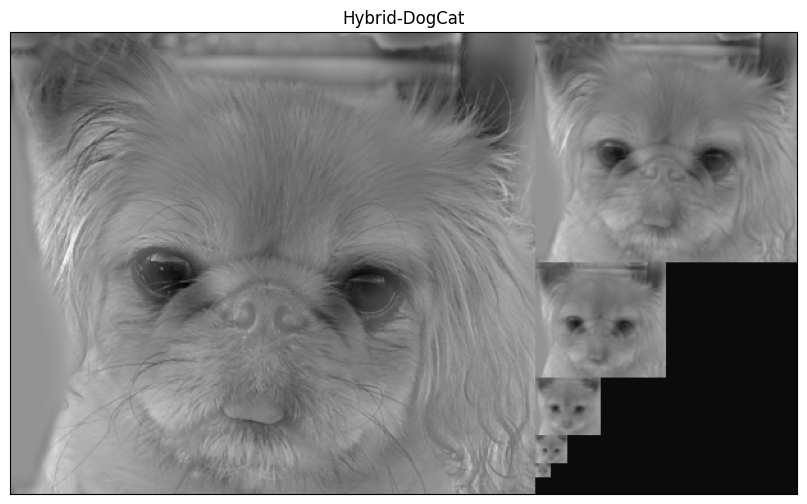

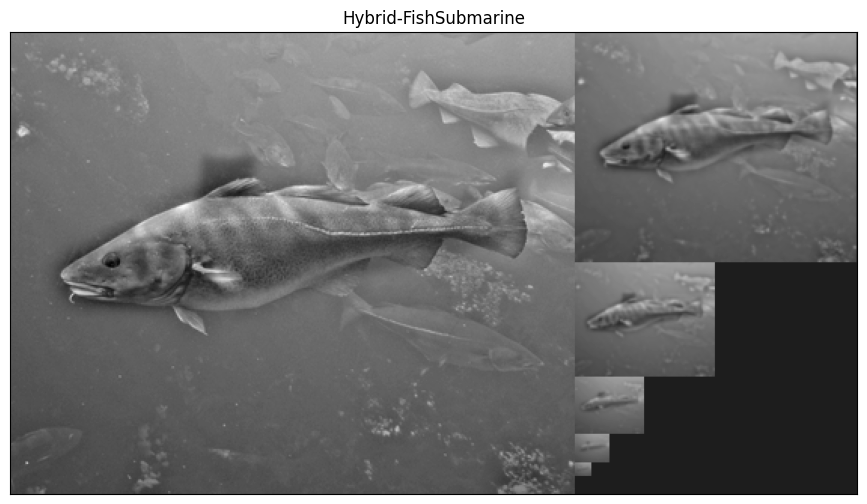

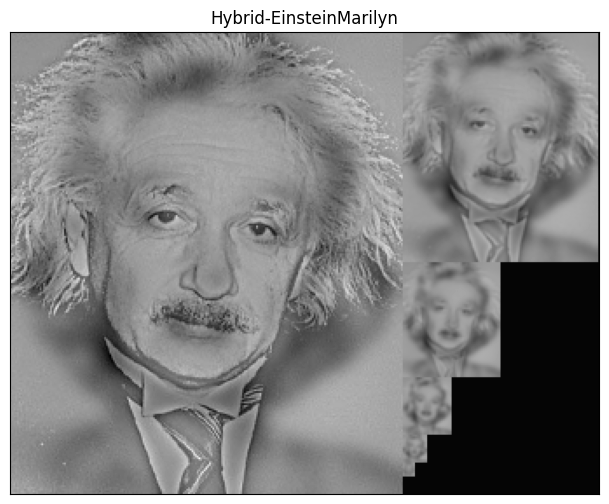

In [34]:
#################### Hybrid-DogCat ####################

# Lectura de imágenes
im1 = cv2.imread(get_image('cat.bmp'), 0)
im2 = cv2.imread(get_image('dog.bmp'), 0)

# Parámetros sigmas
LowFreqSigmaDogCat = 10.0
HighFreqSigmaDogCat = 6.0

# Imagen híbrida
hybridDogCat = hybridImages(im1, im2, LowFreqSigmaDogCat, HighFreqSigmaDogCat)

# Pirámide Gaussiana de 'hybridDogCat'
pyrGaussDogCat = pyramidGauss(hybridDogCat, sizeMask=7, nlevel=5)

# Visualización de la pirámide
displayPyramid(pyrGaussDogCat,'Hybrid-DogCat')

#################### Hybrid-FishSubmarine ####################

# Lectura de imágenes
im3 = cv2.imread(get_image('submarine.bmp'), 0)
im4 = cv2.imread(get_image('fish.bmp'), 0)

# Parámetros sigmas
LowFreqSigmaFishSubmarine = 3.0
HighFreqSigmaFishSubmarine = 8.0

# Imagen híbrida
hybridFishSubmarine = hybridImages(im3, im4, LowFreqSigmaFishSubmarine, HighFreqSigmaFishSubmarine)

# Pirámide Gaussiana de 'hybridFishSubmarine'
pyrGaussFishSubmarine = pyramidGauss(hybridFishSubmarine, sizeMask=7, nlevel=5)

# Visualización de la pirámide
displayPyramid(pyrGaussFishSubmarine,'Hybrid-FishSubmarine')

#################### Hybrid-EinsteinMarilyn ####################

# Lectura de imágenes
im5 = cv2.imread(get_image('marilyn.bmp'), 0)
im6 = cv2.imread(get_image('einstein.bmp'), 0)

# Parámetros sigmas
LowFreqSigmaEinsteinMarilyn = 5.0
HighFreqSigmaEinsteinMarilyn = 3.0

# Imagen híbrida
hybridEinsteinMarilyn = hybridImages(im5, im6, LowFreqSigmaEinsteinMarilyn, HighFreqSigmaEinsteinMarilyn)

# Pirámide Gaussiana de 'EinsteinMarilyn'
pyrGaussEinsteinMarilyn = pyramidGauss(hybridEinsteinMarilyn, sizeMask=7, nlevel=5)

# Visualización de la pirámide
displayPyramid(pyrGaussEinsteinMarilyn,'Hybrid-EinsteinMarilyn')

Vemos como en todas las pirámides Gaussianas de las imágenes híbridades se aprecia lo que buscábamos: en el nivel base de la pirámide se aprecia más la imagen de altas frecuencias (Perro/Pez/Einstein) mientras que ya por el penúltimo nivel de la pirámide se observa la imagen (un poco difusa) de bajas frecuencias (Gato/Submarino/Marilyn).

# **Ejercicio 4: Pyramid Blending** (1 punto)

En este ejercicio se debe crear la imagen fusionada de la manzana (`apple.jpg`; parte superior de la imagen fusionada final) y la naranja (`orange.jpg`; parte inferior de la imagen fusionada final) empleando la técnica de $\textit{Pyramid Blending}$. Para este ejercicio, si se desea, sí se pueden emplear las funciones de OpenCV `pyrDown` y `pyrUp`.

Se debe:
1. explicar en detalle el proceso seguido a la hora de crear la nueva imagen (mezcla de ambas);
2. comparar el resultado con la combinación de las imágenes sin emplear _blending_, es decir, juntando directamente los píxeles de la mitad superior de una imagen con la mitad inferior de la otra;
3. mostrar los estados intermedios del procesado. Es decir, las pirámides Gaussianas calculadas para cada imagen (5 niveles cada una), las pirámides Laplacianas correspondientes, y los distintos niveles en que se va mezclando la imagen de salida (es decir, la reconstrucción en el nivel 1, la reconstrucción en el nivel 2,... y así sucesivamente hasta mostrar la imagen final reconstruida/_blended_).  



El Pyramid Blending es una técnica utilizada en
 el procesamiento de imágenes para combinar dos imágenes de manera suave y gradual. La idea detrás del Pyramid Blending es crear una transición gradual entre las dos imágenes, de modo que no haya bordes visibles en la zona de fusión.

 Para implementar esta técnica, se han seguido los siguientes pasos proporcionados en las diapositivas de esta práctica 1:

1. Leer dos imágenes a color ($imagen1$ e $imagen2$).
2.  Generar la Pirámide Laplaciana de $imagen1$($LP_{imagen1}$).
3.  Generar la Pirámide Laplaciana de $imagen2$ ($LP_{imagen2}$).
4.  Mezclar ambas laplacianas (directamente, tomar la mitad de las filas/columnas de $LP_{imagen1}$ y la otra mitad de $LP_{imagen2}$).
5.  Partir de esta nueva pirámide mezclada/fusionada, y realizar la reconstrucción de la imagen "original".

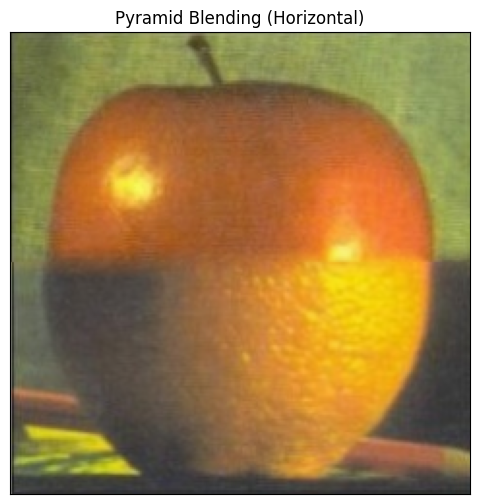

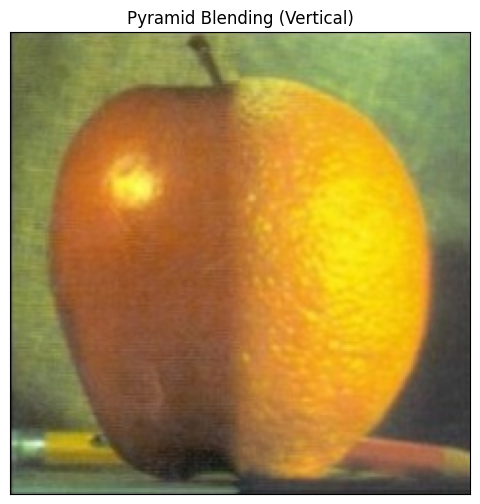

In [35]:
def pyramidBlending(im1, im2, mode=0):
    '''
    Esta función realiza Pyramid Blending entre 'im1' e 'im2'
    en horizontal (si 'mode' = 0) o en vertical (si 'mode' = 1)
    '''
    # Comprobamos que el valor introducido para 'mode' sea correcto
    if(mode != 0 and mode != 1):
      print('error in mode (0 -> Horizontal Blending | 1 -> Vertical Blending)')
    # Si es correcto, realizamos el Pyramid Blending correspondiente
    else:
      # Redimensionamos la imagen 'im2' para que tenga las mismas dimensiones que
      # la imagen 'im1' utilizando interpolación bilineal
      im2 = cv2.resize(im2, (im1.shape[1], im1.shape[0]), cv2.INTER_LINEAR)

      # Generamos la Pirámide Laplaciana de 'im1'
      pyrLapIm1 = pyramidLap(im1, sizeMask=7, nlevel=4)

      # Generamos la Pirámide Laplaciana de 'im2'
      pyrLapIm2 = pyramidLap(im2, sizeMask=7, nlevel=4)

      # Mezclaremos ambas Pirámides Laplacianas, siendo el resultado una nueva
      # Pirámide Laplaciana 'pyrLapBlend'
      pyrLapBlend = []
      # Seleccionamos, para cada nivel correspondiente, la imagen de 'pyrLapIm1'
      # ('levelIm1') y la imagen (del mismo nivel) de 'pyrLapIm2' ('levelIm2')
      for levelIm1, levelIm2 in zip(pyrLapIm1, pyrLapIm2):
        # Inicializamos la imagen fusionada del nivel correspondiente ('levelBlendIm')
        # con todos sus píxeles igualados al valor 0 y con las mismas dimensiones que
        # 'levelIm1' y 'levelIm2'
        rows, cols, channels = levelIm1.shape
        levelBlendIm = np.zeros((rows, cols, channels), dtype = np.float64)

        # Pyramid Blending Horizontal
        if(mode == 0):
          # Tomamos la mitad superior de las filas de 'levelIm1' ('topHalfLevelIm1')
          topHalfLevelIm1 = levelIm1[0:(rows//2), 0:cols]
          # Tomamos la mitad inferior de las filas de 'levelIm2' ('bottomHalfLevelIm2')
          bottomHalfLevelIm2 = levelIm2[(rows//2):rows, 0:cols]

          # Asignamos 'topHalfLevelIm1' a la mitad superior de las filas de 'levelBlendIm'
          levelBlendIm[0:(rows//2), 0:cols] = topHalfLevelIm1
          # Asignamos 'bottomHalfLevelIm2' a la mitad inferior de las filas de 'levelBlendIm'
          levelBlendIm[(rows//2):rows, 0:cols] = bottomHalfLevelIm2
        # Pyramid Blending Vertical
        elif(mode == 1):
          # Tomamos la mitad izquierda de las columnas de 'levelIm1' ('leftHalfLevelIm1')
          leftHalfLevelIm1 = levelIm1[0:rows, 0:(cols//2)]
          # Tomamos la mitad derecha de las columnas de 'levelIm2' ('rightHalfLevelIm2')
          rightHalfLevelIm2 = levelIm2[0:rows, (cols//2):cols]

          # Asignamos 'leftHalfLevelIm1' a la mitad izquierda de las columnas de 'levelBlendIm'
          levelBlendIm[0:rows, 0:(cols//2)] = leftHalfLevelIm1
          # Asignamos 'rightHalfLevelIm2' a la mitad derecha de las columnas de 'levelBlendIm'
          levelBlendIm[0:rows, (cols//2):cols] = rightHalfLevelIm2

        # Añadimos 'levelBlendIm' a la Pirámide Laplaciana 'pyrLapBlend'
        pyrLapBlend.append(levelBlendIm)

      # Partimos de la nueva pirámide mezclada/fusionada 'pyrLapBlend',
      # y realizamos la reconstrucción de la imagen "original" ('finalBlendIm')
      _, finalBlendIm = reconstructLap(pyrLapBlend, cv2.INTER_LINEAR)

      return finalBlendIm

# Lectura de imágenes
im1 = readIm(get_image('apple.jpg'), 1)
im2 = readIm(get_image('orange.jpg'), 1)

# Pyramid Blending Horizontal
horizontalBlendIm = pyramidBlending(im1, im2, mode=0)

# Pyramid Blending Vertical
verticalBlendIm = pyramidBlending(im1, im2, mode=1)

# Visualización de imágenes
displayIm(rangeDisplay01(horizontalBlendIm, True),'Pyramid Blending (Horizontal)')
displayIm(rangeDisplay01(verticalBlendIm, True),'Pyramid Blending (Vertical)')

Observamos que obtenemos una imagen fusionada de la manzana y la naranja, tal y como queríamos. Sin embargo, la zona de fusión destaca demasiado, haciendo que dicha fusión no se vea tan "natural". Esto se debe a la simpleza del algoritmo anterior. Por ello, se ha optado por hacer una versión mejorada de dicho algoritmo, el cual viene descrito en las diapositivas de teoría. Los pasos a seguir ahora serían los siguientes:

1. Generar la Pirámide Laplaciana, $L_A$ y $L_B$, para ambas imágenes de entrada, $A$ y $B$. Tener en cuenta que para ello, necesitamos primero las Pirámides Gaussianas.
2. Construir una Pirámide Gaussiana $G_R$ a partir de la región de selección $R$, la cual no es más que una máscara que nos dice qué píxeles seleccionamos de la imagen $A$ y cuáles de la imagen $B$.
3. Formar una Pirámide Laplaciana Combinada $L$ a partir de $L_A$ y $L_B$ usando los píxeles de $G_R$ como "pesos".

$$L(i,j) = G_R(i,j)L_A(i,j) + (1 - G_R(i,j))L_B(i,j)$$

4. Partir de esta nueva Pirámide Laplaciana Combinada $L$, y realizar la reconstrucción de la imagen "original".

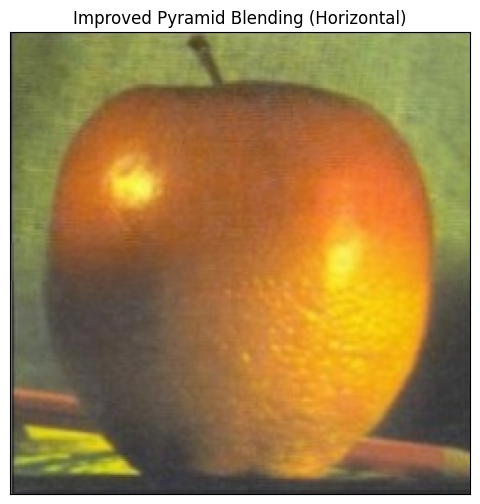

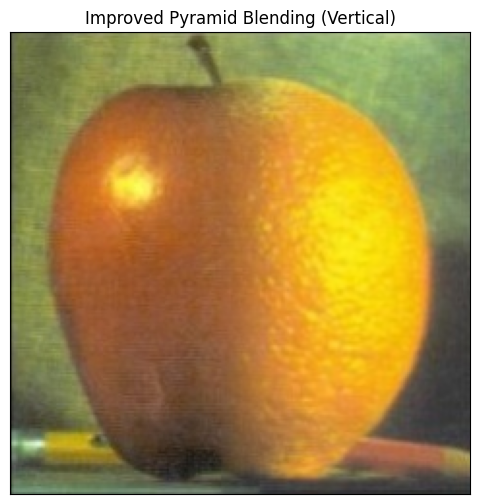

In [36]:

#Esta función realiza Pyramid Blending entre una region 'region' de la imagen 'im1' y la imagen 'im2'

def improvedPyramidBlending(im1, im2, region):

    # Redimensionamos la imagen 'im2' para que tenga las mismas dimensiones que
    # la imagen 'im1' utilizando interpolación bilineal
    im2 = cv2.resize(im2, (im1.shape[1], im1.shape[0]), cv2.INTER_LINEAR)

    # Generamos la Pirámide Laplaciana de 'im1'
    pyrLapIm1 = pyramidLap(im1, sizeMask=7, nlevel=4)

    # Generamos la Pirámide Laplaciana de 'im2'
    pyrLapIm2 = pyramidLap(im2, sizeMask=7, nlevel=4)

    # Generamos la Pirámide Gaussiana de 'region'
    pyrGaussR = pyramidGauss(region, sizeMask=7, nlevel=4)

    # Mezclaremos ambas Pirámides Laplacianas, siendo el resultado una nueva
    # Pirámide Laplaciana 'pyrLapBlend'
    pyrLapBlend = []
    # Seleccionamos, para cada nivel correspondiente, la imagen de 'pyrLapIm1'
    # ('levelIm1'), la imagen (del mismo nivel) de 'pyrLapIm2' ('levelIm2')
    # y la imagen (del mismo nivel) de 'pyrGaussR' ('levelReg')
    for levelIm1, levelIm2, levelReg in zip(pyrLapIm1, pyrLapIm2, pyrGaussR):
      # Inicializamos la imagen fusionada del nivel correspondiente ('levelBlendIm')
      # con todos sus píxeles igualados al valor 0 y con las mismas dimensiones que
      # 'levelIm1' y 'levelIm2'
      rows, cols, channels = levelIm1.shape
      levelBlendIm = np.zeros((rows, cols, channels), dtype = np.float64)

      # 'levelBlendIm' va a ser igual a la mezcla/combinación de 'levelIm1'
      # y 'levelIm2' usando los píxeles de 'levelReg' como "pesos"
      for i in range(rows):
        for j in range(cols):
          levelBlendIm[i][j] = levelReg[i][j] * levelIm1[i][j] + (1.0 - levelReg[i][j]) * levelIm2[i][j]

      # Añadimos 'levelBlendIm' a la Pirámide Laplaciana 'pyrLapBlend'
      pyrLapBlend.append(levelBlendIm)

    # Partimos de la nueva pirámide mezclada/fusionada 'pyrLapBlend',
    # y realizamos la reconstrucción de la imagen "original" ('finalBlendIm')
    _, finalBlendIm = reconstructLap(pyrLapBlend, cv2.INTER_LINEAR)

    return finalBlendIm

# Lectura de imágenes
im1 = readIm(get_image('apple.jpg'), 1)
im2 = readIm(get_image('orange.jpg'), 1)

########## Pyramid Blending Horizontal ##########

# Inicializamos la región 'horizontalRegion' para realizar el Pyramid Blending Horizontal
horizontalRegion = np.zeros(im1.shape, dtype = np.float64)
horizontalRegionRows, horizontalRegionCols, horizontalRegionChannels = horizontalRegion.shape

# Establecemos la mitad superior, excepto las últimas 10 filas de dicha mitad,
# de 'horizontalRegion' al valor 1.0 (para quedarnos completamente con los píxeles
# de dichas filas de 'im1')
horizontalRegion[0:(horizontalRegionRows//2 - 10), 0:horizontalRegionCols] = 1.0

# Establecemos las últimas 10 filas de la mitad superior de 'horizontalRegion'
# y las 10 filas siguientes al valor 0.5 (para así conseguir un corte más
# difuminado a la hora de mezclar 'im1' e 'im2', consiguiendo un mejor efecto visual)
horizontalRegion[(horizontalRegionRows//2 - 10):(horizontalRegionRows//2 + 10), 0:horizontalRegionCols] = 0.5

# Pyramid Blending Horizontal
improvedHorizontalBlendIm = improvedPyramidBlending(im1, im2, horizontalRegion)

# Visualización de imágenes
displayIm(rangeDisplay01(improvedHorizontalBlendIm, True),'Improved Pyramid Blending (Horizontal)')

########## Pyramid Blending Vertical ##########

# Inicializamos la región 'verticalRegion' para realizar el Pyramid Blending Vertical
verticalRegion = np.zeros(im1.shape, dtype = np.float64)
verticalRegionRows, verticalRegionCols, verticalRegionChannels = verticalRegion.shape

# Establecemos la mitad izquierda, excepto las últimas 10 columnas de dicha mitad,
# de 'verticalRegion' al valor 1.0 (para quedarnos completamente con los píxeles
# de dichas columnas de 'im1')
verticalRegion[0:verticalRegionRows, 0:(verticalRegionCols//2 - 10)] = 1.0

# Establecemos las últimas 10 columnas de la mitad izquierda de 'verticalRegion'
# y las 10 siguientes al valor 0.5 (para así conseguir un corte más difuminado
# a la hora de mezclar 'im1' e 'im2', consiguiendo un mejor efecto visual)
verticalRegion[0:verticalRegionRows, (verticalRegionCols//2 - 10):(verticalRegionCols//2 + 10)] = 0.5

# Pyramid Blending Vertical
improvedVerticalBlendIm = improvedPyramidBlending(im1, im2, verticalRegion)

# Visualización de imágenes
displayIm(rangeDisplay01(improvedVerticalBlendIm, True),'Improved Pyramid Blending (Vertical)')

Se observa claramente que la zona de fusión entre ambas imágenes se encuentra más difuminada si usamos esta última versión del algoritmo, consiguiendo así ese efecto más "natural" que buscábamos.